# Using Explainable AI to Investigate Navigational Affordances in Real-world Scenes

**Authors: Clemens G. Bartnik & Iris I.A. Groen**

*Video & Image Sense Lab, Informatics Institute, University of Amsterdam, The Netherlands*

Moving through the world requires extracting navigational affordances from our immediate environment. How do we compute navigational affordances from visual inputs and which visual features are important? Recent work shows that navigational affordances of indoor scenes are captured by deep convolutional neural networks (CNNs) trained for scene recognition (Bonner & Epstein, 2018). Here, we investigated the ability of CNNs to capture affordances in a broader set of environments using different explainable AI feature visualizations (GradCam, LRP, LIME) and different task objectives/network models (depth perception, scene segmentation). We curated a diverse set of 231 naturalistic real-world indoor, outdoor man-made and outdoor natural scenes and collected human annotations depicting which path trajectory participants (N=152) would take through the scene. Visual inspection shows that path drawings are quite consistent among participants and thus diagnostic features for potential paths are present. Using representational similarity analysis, we find that across all environments, no single CNN feature representation correlates best with human path annotations. For indoor environments, highest correlations were found with GradCam visual explanations of important regions for the class prediction, and layout-related information captured by CNN-generated depth maps. In contrast, for outdoor natural and outdoor man-made environments LRP activations, highlighting the impact of input pixels on the class prediction, correlated best with human annotations. These results show that no single CNN feature representation adequately captures navigational affordances, and that future models need to incorporate multiple relevant features that humans use to perceive a possible path through natural scenes.


In [1]:
import os 
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras.preprocessing import image
from tensorflow.keras.models import Model
import matplotlib.pyplot as plt
#from tensorflow.keras.applications.vgg19 import preprocess_input, decode_predictions
import os
import numpy as np
import random
from sklearn.decomposition import PCA
from scipy.stats import pearsonr
import pandas as pd
import scipy.io as spio
from scipy.spatial.distance import squareform
from scipy.stats import rankdata, spearmanr

from sklearn.metrics import pairwise_distances
import seaborn as sns

from PIL import Image 

import cv2
import keras.backend as K 

from scipy.spatial.distance import squareform
from scipy.stats import kendalltau
import ipywidgets as widgets

import warnings
warnings.filterwarnings('ignore')


import similaritymeasures
from scipy import stats

from scipy.interpolate import interp1d

# Helper Functions (Bonner/Comparision)

In [70]:
#####################################################################################################

def plot_img_next_to_other_representation(number_img, other_representation_array, other_rep_name): 
    
    dim = (224,224)
    img = np.array(Image.open(Bonner_image_list_dir[number_img]))
    img_resized = img = cv2.resize(img, dim, interpolation = cv2.INTER_AREA)

    fig, axs = plt.subplots(1, 2, figsize=(5, 5))
    axs[0].set_title("Stimuli")
    axs[0].imshow(img_resized)
    axs[0].axis("off")

    axs[1].set_title(other_rep_name)
    axs[1].imshow(other_representation_array[number_img])
    axs[1].axis("off")


    plt.show() 
    
#####################################################################################################

def normalize_2D(image):
    [w, h] = image.shape
    x = image.flatten()
    normalized = (x-min(x))/(max(x)-min(x))
    norm_img = normalized.reshape(w,h)
    return norm_img 

#####################################################################################################

def split_image_into_tiles(img, n_slices, method = "mean"):
    """ 
    This function takes an image and slices the into tiles and setting them to the a value specified by the method.
    
    parameters:
    img - array: array of an image that should be tiled 
    
    n-slices - int: number of slices for each axis
    
    method - string: "mean" (default) replaces the values in the field with the mean value of that area
                     "max"  replaces the values with the max value of that area
                     "min"  replaces the values with the min value

    """
    
    image = img.copy()
    [w, h] = image.shape

    r = np.linspace(0, w, n_slices+1) 
    r_tuples = [(int(r[i]), int(r[i+1])) for i in range(0, len(r)-1)]
    q = np.linspace(0, h, n_slices+1)
    q_tuples = [(int(q[i]), int(q[i+1])) for i in range(0, len(q)-1)]
    
    tile_means = []
    for row in range(n_slices):
        for column in range(n_slices):
            [x1, y1, x2, y2] = *r_tuples[row], *q_tuples[column]
            tile = image[x1:y1, x2:y2]
            if method == "mean":
                image[x1:y1, x2:y2] = np.mean(tile)
                tile_means.append(np.mean(tile))
            elif method == "max":
                image[x1:y1, x2:y2] = np.max(tile)
                tile_means.append(np.max(tile))
            elif method == "min":
                image[x1:y1, x2:y2] = np.min(tile)
                tile_means.append(np.min(tile))
                                             
            else:
                print("This method is not available!")
                
    return image, tile_means
    
    #maybe add a return of the mean values as an array that we then can compare them.
    
#####################################################################################################
    
def plot_all_splits_side_by_side(count, n_slices, method = "mean"):
    
    img_lrp = normalize_2D(Bonner_lrp_array[count])
    img_lime = normalize_2D(Bonner_LIME_array[count])
    img_mean_path = normalize_2D(bonnerTrajs[count])
    img_depth = normalize_2D(Bonner_depthmap_arrays[count])
    img_Grad = normalize_2D(Bonner_grad_cam_arrays[count])
    img_seg = normalize_2D(floor_seg_array[count])
    
    split_lrp, lrp_means = split_image_into_tiles(img_lrp, n_slices, method = method)
    split_lime, lime_means = split_image_into_tiles(img_lime, n_slices, method = method)
    split_path, path_means = split_image_into_tiles(img_mean_path, n_slices, method = method)
    split_depth, depth_means = split_image_into_tiles(img_depth, n_slices, method = method)
    split_Grad, grad_means = split_image_into_tiles(img_Grad, n_slices, method = method)
    split_seg, seg_means = split_image_into_tiles(img_seg, n_slices, method = method)
    
    list_of_images = [split_path, split_depth, split_lrp, split_lime,split_Grad, split_seg]
    names = ["Mean Path", "Depth Map", "LRP", "LIME", "GradCam", "Floor Segmentation"]
    fig,ax = plt.subplots(1,len(list_of_images), figsize=(20, 10))
    for i,img in enumerate(list_of_images):
        ax[i].set_title(names[i])
        ax[i].imshow(img)
        ax[i].axis("off")
        
    plt.show(block = False)
    
    # compute correlation
    list_of_means = [path_means, depth_means, lrp_means, lime_means, grad_means, seg_means]

    overview = np.zeros([len(list_of_means), len(list_of_means)])
    for count1, base in enumerate(list_of_means):
        for count2, second in enumerate(list_of_means):
            rdm_corr, pval = kendalltau(base, second)
            overview[count1, count2] = rdm_corr

    fig,ax = plt.subplots(1,1, figsize=(5, 5))
    ax.imshow(overview, vmin = -1, vmax = 1, cmap = "RdBu")
    
    for (j,i),label in np.ndenumerate(overview):
        ax.text(i,j,label.round(2),ha='center',va='center')
    
    ax.set_yticks(np.arange(len(list_of_means)))
    ax.set_xticks(np.arange(len(list_of_means)))
    ax.set_yticklabels(names)
    ax.set_xticklabels(names, rotation=40)
    plt.show(block = False)

##################################################################################################

def plot_representational_geometries_with_corr(n_slices):
    '''
    This function splits the images into the specified number of slices and computes the pair-wise similiarity 
    between all other images and thereby creates a representational space for each input modality/representation.   
    
    input: n_slices - int: number of slices in which the image should be split along each axis
    
    output: plots the representations side by side and a overview showing the correlations (kendall's tau) between them.
    
    '''
    # Select the number of slices
    length_of_means = n_slices * n_slices

    mean_array = np.zeros([50, 6, length_of_means])
    method = "mean"
    for count in range(50):
        #print("Processing Image: " , count)

        img_lrp = normalize_2D(Bonner_lrp_array[count])
        img_lime = normalize_2D(Bonner_LIME_array[count])
        img_mean_path = normalize_2D(bonnerTrajs[count])
        img_depth = normalize_2D(Bonner_depthmap_arrays[count])
        img_Grad = normalize_2D(Bonner_grad_cam_arrays[count])
        img_seg = normalize_2D(floor_seg_array[count])

        split_lrp, lrp_means = split_image_into_tiles(img_lrp, n_slices, method = method)
        split_lime, lime_means = split_image_into_tiles(img_lime, n_slices, method = method)
        split_path, path_means = split_image_into_tiles(img_mean_path, n_slices, method = method)
        split_depth, depth_means = split_image_into_tiles(img_depth, n_slices, method = method)
        split_Grad, grad_means = split_image_into_tiles(img_Grad, n_slices, method = method)
        split_seg, seg_means = split_image_into_tiles(img_seg, n_slices, method = method)

        length_of_means = n_slices * n_slices

        list_of_means = [path_means, depth_means, lrp_means, lime_means, grad_means, seg_means]
        for count2, i in enumerate(list_of_means):
            mean_array[count][count2] = i

    list_of_images = [split_path, split_depth, split_lrp, split_lime, split_Grad, split_seg]
    names = ["Mean Path", "Depth Map", "LRP", "LIME", "GradCam", "Floor Segmentation"]
    fig,ax = plt.subplots(1,len(list_of_images), figsize=(20, 10))
    for i,img in enumerate(list_of_images):
        ax[i].set_title(names[i])
        ax[i].imshow(img)
        ax[i].axis("off")
        
    plt.show(block = False)
    
    # Compute the RDMs and the RDVs

    rdms = np.zeros([6,50,50])
    rdvs = np.zeros([6, 1225])
    for i in range(6):
        rdms[i] = pairwise_distances(mean_array[:,i] , metric= 'euclidean')
        rdvs[i] = squareform(rdms[i].round(5))


    # Plot the resulting representational geometries across all 50 images

    #RDM_names = ["Mean Path", "Depth Map", "LRP", "LIME", "Floor Seg"]

    fig,ax = plt.subplots(1,len(rdms), figsize=(20, 10))
    for i,rdm in enumerate(rdms):
        ax[i].set_title(names[i])
        ax[i].imshow(rdm)
        ax[i].axis("off")

    # compute the correlation between the representational geometries
    overview = np.zeros([len(rdvs), len(rdvs)])
    for count1, base in enumerate(rdvs):
        for count2, second in enumerate(rdvs):
            rdm_corr, pval = kendalltau(base, second)
            overview[count1, count2] = rdm_corr

    # Plot the correlation matrix between the representatinal geometries

    fig,ax = plt.subplots(1,1, figsize=(5, 5))
    ax.imshow(overview, vmin = -1, vmax = 1, cmap = "RdBu")

    for (j,i),label in np.ndenumerate(overview):
        ax.text(i,j,label.round(2),ha='center',va='center')

    ax.set_yticks(np.arange(len(names)))
    ax.set_xticks(np.arange(len(names)))
    ax.set_yticklabels(names)
    ax.set_xticklabels(names, rotation=40)
    plt.show(block = False)
    
    return rdms

##################################################################################################

def save_all_image_reps_bonner(count, n_slices, save_path): 
    
    img_lrp = normalize_2D(Bonner_lrp_array[count])
    img_lime = normalize_2D(Bonner_LIME_array[count])
    img_mean_path = normalize_2D(bonnerTrajs[count])
    img_depth = normalize_2D(Bonner_depthmap_arrays[count])
    img_Grad = normalize_2D(Bonner_grad_cam_arrays[count])
    img_seg = normalize_2D(floor_seg_array[count])
    
    split_lrp, lrp_means = split_image_into_tiles(img_lrp, n_slices, method = "mean")
    split_lime, lime_means = split_image_into_tiles(img_lime, n_slices, method = "mean")
    split_path, path_means = split_image_into_tiles(img_mean_path, n_slices, method = "mean")
    split_depth, depth_means = split_image_into_tiles(img_depth, n_slices, method = "mean")
    split_Grad, grad_means = split_image_into_tiles(img_Grad, n_slices, method = "mean")
    split_seg, seg_means = split_image_into_tiles(img_seg, n_slices, method = "mean")
    
    list_of_images = [split_path, split_depth, split_lrp, split_lime, split_Grad, split_seg]
    names = ["Mean Path", "Depth Map", "LRP", "LIME", "Grad Cam", "Floor Segmentation"]
    
    for i in range(len(list_of_images)):
        
        fig,ax = plt.subplots(1,1, figsize=(10, 10))
   
        #ax.set_title(names[i])
        ax.imshow(list_of_images[i])
        ax.axis("off")
        
        plt.savefig(save_path + str(count) + '_' + str(n_slices) + '_' + names[i] + '_bonner.png', bbox_inches='tight', dpi = 300)
        plt.close()
        

# Comparision between the different spaces

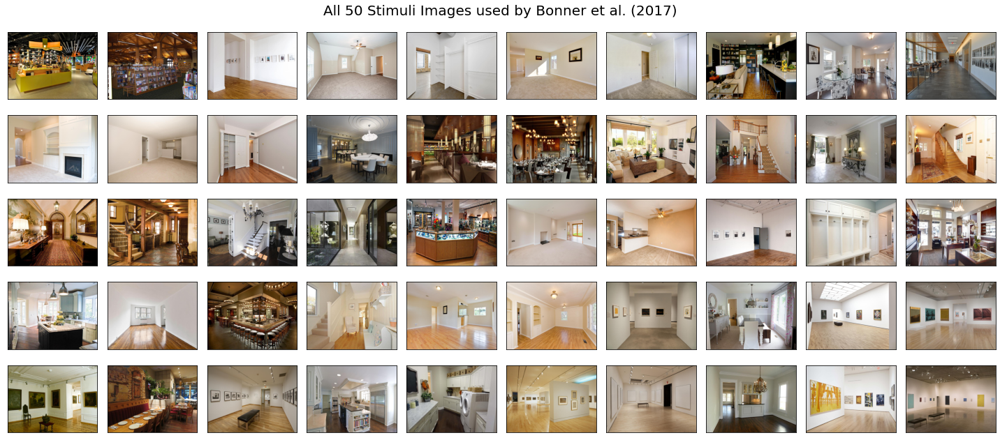

In [3]:
bonner_img_dir = "C:\\Users\\cbartni\\Dropbox\\PhD\\Vision_for_action\\Articles\\Bonner_Paper_supp_Material\\stimuli\\stimuli\\"
# define number of rows and columns
n_row = 5         # number of rows
n_col = 10         # number of columns


bonner_img_list = []
for img in os.listdir(bonner_img_dir):
    bonner_img_list.append(img)
    
# plot images
fig, axs = plt.subplots(n_row, n_col, figsize=(20, 9))
img_count = 0
for i in range(n_row):
    for j in range(n_col):

        # get path
        path = bonner_img_dir + bonner_img_list[img_count]

        # plot image
        axs[i,j].imshow(np.array(Image.open(path)))
        axs[i,j].set_xticks([])
        axs[i,j].set_yticks([])
        # increment counter
        img_count = img_count + 1
fig.suptitle("All 50 Stimuli Images used by Bonner et al. (2017)", fontsize = 20)
plt.tight_layout()
plt.show()

## Load the different representations for the Bonner stimuli:

In [4]:
def save_figure(number_img, rep, filename): 
    
    dim = (224,224)
    img = np.array(Image.open(Bonner_image_list_dir[number_img]))
    img_resized = cv2.resize(img, dim, interpolation = cv2.INTER_AREA)

    fig, axs = plt.subplots(1, 1, figsize=(5, 5))
    #axs.set_title(title)
    #axs.imshow(rep[number_img])
    axs.imshow(img_resized)
    axs.axis("off")

    plt.tight_layout()
    plt.savefig("C:\\Users\\cbartni\\surfdrive\\PhD\\SceneRepresentationXAI\\poster_images\\" + filename + ".svg", dpi = 300)

In [5]:
# path = bonnerTrajs
# depth = Bonner_depthmap_arrays
# LRP = Bonner_lrp_array
# LIME = Bonner_LIME_array
# GradCam = Bonner_grad_cam_arrays
# Scene Segmentation = floor_seg_array
#save_figure(24,  floor_seg_array, "image_24")

## Mean Path

In [6]:
# Image List for the Bonner Stimuli

Bonner_image_list_dir = []
Bonner_image_list = []
bonner_img_dir = "C:\\Users\\cbartni\\Dropbox\\PhD\\Vision_for_action\\Articles\\Bonner_Paper_supp_Material\\stimuli\\stimuli\\"
for img in os.listdir(bonner_img_dir):
    Bonner_image_list.append(img)
    Bonner_image_list_dir.append(bonner_img_dir + img)
    
# Load the by the author's provided matlab file containg the trajectories drawn by 12 different participants.

lib = spio.loadmat('C:\\Users\\cbartni\\Dropbox\\PhD\\Vision_for_action\\Articles\\Bonner_Paper_supp_Material\\Trajs.mat')
trajs = lib['Trajs']
labels = ['pathways0173', 'pathways0168', 'pathways0162', 'pathways0220', 'pathways0161', 'pathways0035', 'pathways0011', 'pathways0084', 'pathways0093', 'pathways0057', 'pathways0233', 'pathways0064', 'pathways0015', 'pathways0036', 'pathways0056', 'pathways0242', 'pathways0052', 'pathways0069', 'pathways0055', 'pathways0239', 'pathways0180', 'pathways0127', 'pathways0208', 'pathways0209', 'pathways0050', 'pathways0001', 'pathways0225', 'pathways0178', 'pathways0002', 'pathways0096', 'pathways0027', 'pathways0081', 'pathways0165', 'pathways0176', 'pathways0169', 'pathways0204', 'pathways0211', 'pathways0121', 'pathways0039', 'pathways0202', 'pathways0094', 'pathways0063', 'pathways0156', 'pathways0203', 'pathways0067', 'pathways0133', 'pathways0045', 'pathways0200', 'pathways0153', 'pathways0062', 'pathways0008', 'pathways0217', 'pathways0014', 'pathways0128', 'pathways0222', 'pathways0019', 'pathways0174', 'pathways0227', 'pathways0046', 'pathways0191', 'pathways0244', 'pathways0163', 'pathways0038', 'pathways0076', 'pathways0232', 'pathways0186', 'pathways0195', 'pathways0089', 'pathways0207', 'pathways0150', 'pathways0201', 'pathways0243', 'pathways0188', 'pathways0235', 'pathways0166', 'pathways0029', 'pathways0197', 'pathways0237', 'pathways0157', 'pathways0226', 'pathways0143', 'pathways0231', 'pathways0216', 'pathways0049', 'pathways0047', 'pathways0044', 'pathways0205', 'pathways0092', 'pathways0018', 'pathways0187', 'pathways0171', 'pathways0032', 'pathways0183', 'pathways0051', 'pathways0058', 'pathways0078', 'pathways0085', 'pathways0229', 'pathways0079', 'pathways0241', 'pathways0003', 'pathways0238', 'pathways0184', 'pathways0175', 'pathways0073', 'pathways0023', 'pathways0164', 'pathways0144', 'pathways0004', 'pathways0192', 'pathways0182', 'pathways0009', 'pathways0012', 'pathways0206', 'pathways0010', 'pathways0158', 'pathways0223', 'pathways0028', 'pathways0146', 'pathways0221', 'pathways0037', 'pathways0077', 'pathways0170', 'pathways0024', 'pathways0224', 'pathways0230', 'pathways0068', 'pathways0196', 'pathways0122', 'pathways0071', 'pathways0054', 'pathways0087', 'pathways0234', 'pathways0040', 'pathways0212', 'pathways0190', 'pathways0148', 'pathways0013', 'pathways0098', 'pathways0016', 'pathways0228', 'pathways0159', 'pathways0007', 'pathways0065', 'pathways0154', 'pathways0074', 'pathways0218', 'pathways0082', 'pathways0061', 'pathways0091', 'pathways0086', 'pathways0215', 'pathways0181', 'pathways0060', 'pathways0059', 'pathways0210', 'pathways0185', 'pathways0041', 'pathways0080', 'pathways0116', 'pathways0167', 'pathways0198', 'pathways0149', 'pathways0083', 'pathways0172', 'pathways0193', 'pathways0240', 'pathways0031', 'pathways0245', 'pathways0199', 'pathways0219', 'pathways0189', 'pathways0020']

bonnerTrajs = np.zeros([len(Bonner_image_list), 224, 224])
for count, i in enumerate(Bonner_image_list):
    idx = labels.index(i[:-4])
    img = trajs[0][0][idx]
    img_mean = img.mean(axis=(2))
    bonnerTrajs[count] = cv2.resize(img_mean, (224, 224))
    
# all Trajectories can be found in the variable   

# bonnerTrajs

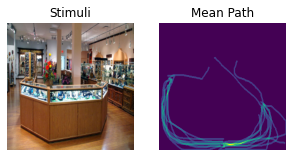

In [7]:
plot_img_next_to_other_representation(24, bonnerTrajs, "Mean Path")

## Depth Map

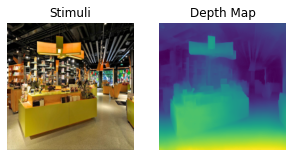

In [8]:
Bonner_depth_dir = "C:\\Users\\cbartni\\surfdrive\\PhD\\SceneRepresentationXAI\\XAIReps\\Bonner_depth\\"

Bonner_depthmap_arrays = np.zeros([len(Bonner_image_list), 224, 224])
for count, img in enumerate(Bonner_image_list):
    depthmap = Image.open(Bonner_depth_dir + img[:-4] + ".png")
    depthmap = np.array(depthmap, dtype='float64')
    depthmap_resized = cv2.resize(depthmap, (224,224))
    Bonner_depthmap_arrays[count] = depthmap_resized

    
# Plot image next to the Depth Map

plot_img_next_to_other_representation(0, Bonner_depthmap_arrays, "Depth Map")
  

## Layer-Wise Relevance Propagation (LRP)

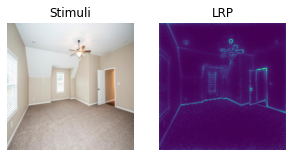

In [9]:
Bonner_LRP_dir = "C:\\Users\\cbartni\\surfdrive\\PhD\\SceneRepresentationXAI\\XAIReps\\BonnerLRP_arrays\\"

Bonner_lrp_array = np.zeros([len(Bonner_image_list), 224, 224])
for count, img in enumerate(Bonner_image_list):
    name = Bonner_LRP_dir + img[:-4] + "_lrp.npy"
    Bonner_lrp_array[count] = np.load(name)
    
plot_img_next_to_other_representation(3, Bonner_lrp_array, "LRP")    

## LIME (Local Interpretable Model-agnostic Explanations)

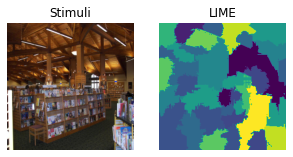

In [10]:
Bonner_LIME_dir = "C:\\Users\\cbartni\\surfdrive\\PhD\\SceneRepresentationXAI\\XAIReps\\Bonner_LIME\\"

Bonner_LIME_array = np.zeros([len(Bonner_image_list), 224, 224])
for count, img in enumerate(Bonner_image_list):
    name = Bonner_LIME_dir + img[:-4] + "_LIME.npy"
    Bonner_LIME_array[count] = np.load(name)
    
plot_img_next_to_other_representation(1, Bonner_LIME_array, "LIME")  

## Floor Segmentation

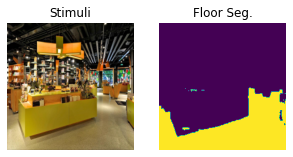

In [11]:
Bonner_seg_dir = "C:\\Users\\cbartni\\surfdrive\\PhD\\SceneRepresentationXAI\\XAIReps\\SceneSegBonner\\"

floor_seg_array = np.zeros([50, 224,224], dtype = np.float32)
for count, img in enumerate(Bonner_image_list):
    for i in os.listdir(Bonner_seg_dir + img[:-4]):
        if "floor.npy" in i:
            vis = np.load(Bonner_seg_dir + img[:-4] + "\\" + i)
            vis = vis.astype(float)
            floor_seg = cv2.resize(vis,(224,224))
            # change the color of background and foreground to match viridis colomap
            mask_bg = (floor_seg == [0,0,0]).all(axis=2)
            mask_fg = (floor_seg == [80,50,50]).all(axis=2)
            new_seg_img = np.zeros([floor_seg.shape[0], floor_seg.shape[1]])
            new_seg_img[mask_bg] = [0]
            new_seg_img[mask_fg] = [1]
            
            floor_seg_array[count] = new_seg_img
            
plot_img_next_to_other_representation(0, floor_seg_array, "Floor Seg.") 

## Grad Cam

In [12]:
GradCam_bonner_dir = "C:\\Users\\cbartni\\surfdrive\\PhD\\SceneRepresentationXAI\\XAIReps\\BonnerOutput\\"
Bonner_grad_cam_arrays = np.zeros([len(Bonner_image_list), 224, 224])
for count, img in enumerate(Bonner_image_list):
    Bonner_grad_cam_arrays[count] = cv2.resize(np.load(GradCam_bonner_dir + img[:-4] + "_block5_conv3_.npy"), (224,224))

## Interactive Comparision

In [13]:
widgets.interact(plot_all_splits_side_by_side, count = (0,50,1), n_slices = (1, 224, 1), method = ["mean", "min", "max"])

interactive(children=(IntSlider(value=25, description='count', max=50), IntSlider(value=112, description='n_sl…

<function __main__.plot_all_splits_side_by_side(count, n_slices, method='mean')>

The most basic approach in Representational Similiarity Analysis is to just flatten the whole image and correlate them with other pictures. But does this actually is an adequate way? With the silders in the interactive plot you can change the displayed image using the **count** slider and the resolution of the images using the **n_slices** slider. Below the plot we see the correlation (*kendalls tau*) between the individual representations. 

In the next step we will take a look how this correlation changes along the different resolutions.

In [14]:
all_img_all_splits_overviews = np.load("C:\\Users\\cbartni\\surfdrive\\PhD\\SceneRepresentationXAI\\Overview_arrays\\all_img_all_split_bonner.npy")

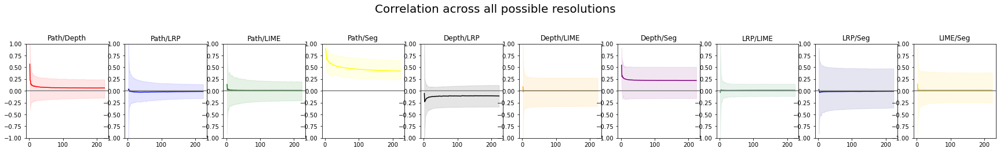

In [15]:
array_path_depth = np.zeros([50, 224]) # all_overviews[:,0,1]
array_path_lrp = np.zeros([50, 224]) # all_overviews[:,0,2]
array_path_lime = np.zeros([50, 224]) # all_overviews[:,0,3]
array_path_seg = np.zeros([50, 224]) # all_overviews[:,0,4]
array_depth_lrp = np.zeros([50, 224]) # all_overviews[:,1,2]
array_depth_lime = np.zeros([50, 224]) # all_overviews[:,1,3]
array_depth_seg = np.zeros([50, 224]) # all_overviews[:,1,4]
array_lrp_lime = np.zeros([50, 224]) # all_overviews[:,2,3]
array_lrp_seg = np.zeros([50, 224]) # all_overviews[:,2,4]
array_lime_seg = np.zeros([50, 224]) # all_overviews[:,3,4]
names = ["Path/Depth", "Path/LRP", "Path/LIME", "Path/Seg", "Depth/LRP", "Depth/LIME", "Depth/Seg", "LRP/LIME", "LRP/Seg", "LIME/Seg"]

array_list = [array_path_depth, array_path_lrp, array_path_lime, array_path_seg, array_depth_lrp, 
              array_depth_lime, array_depth_seg, array_lrp_lime, array_lrp_seg, array_lime_seg]

x = np.arange(224)
for i in range(50):
    all_overviews = all_img_all_splits_overviews[i].copy()
    
    array_path_depth[i] = all_overviews[:,0,1]
    array_path_lrp[i] = all_overviews[:,0,2]
    array_path_lime[i] = all_overviews[:,0,3]
    array_path_seg[i] = all_overviews[:,0,4]
    array_depth_lrp[i] = all_overviews[:,1,2]
    array_depth_lime[i] = all_overviews[:,1,3]
    array_depth_seg[i] = all_overviews[:,1,4]
    array_lrp_lime[i] = all_overviews[:,2,3]
    array_lrp_seg[i] = all_overviews[:,2,4]
    array_lime_seg[i] = all_overviews[:,3,4]

means = np.zeros([len(array_list),224])
highs = np.zeros([len(array_list),224])
lows = np.zeros([len(array_list),224])
for count, i in enumerate(array_list):
    means[count] = np.mean(i, axis = 0)
    highs[count] = np.nanmax(i, axis = 0)
    lows[count] = np.nanmin(i, axis = 0)
    
fig,ax = plt.subplots(1,len(array_list), figsize=(30, 3))  

color_names = ["red", "blue", "green", "yellow", "black", "orange", "purple", "seagreen", "navy", "gold", "cyan"]
for i in range(len(array_list)):
    ax[i].plot(x, means[i], color = color_names[i])
    ax[i].fill_between(x, highs[i],  lows[i], color=color_names[i], alpha=0.1)
    ax[i].axhline(y = 0, color = "grey")
    ax[i].set_ylim(-1,1)
    ax[i].set_title(names[i])
fig.suptitle("Correlation across all possible resolutions", fontsize = 20, y = 1.2)
plt.show()

We can see that at very low resolutions we have a quite high difference between the different images. The width is showing the lowest and highest correlation found between the different images. For some this difference narrows down quite a bit like for Path/LRP or Path/Depth but for some it keeps wide like LRP/SEG.

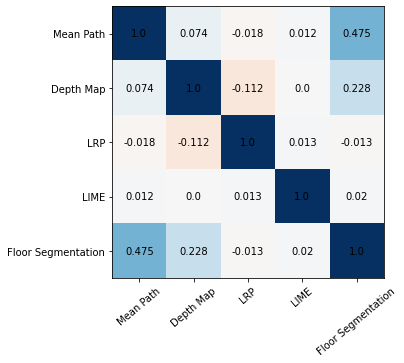

In [16]:
x = np.nanmean(all_img_all_splits_overviews, axis = 0)
x = np.nanmean(x, axis = 0)

mean_overview = x.round(3)
names = ["Mean Path", "Depth Map", "LRP", "LIME", "Floor Segmentation"]

fig,ax = plt.subplots(1,1, figsize=(5, 5))
ax.imshow(mean_overview, vmin = -1, vmax = 1, cmap = "RdBu")

for (j,i),label in np.ndenumerate(mean_overview):
    ax.text(i,j,label,ha='center',va='center')

ax.set_yticks(np.arange(len(names)))
ax.set_xticks(np.arange(len(names)))
ax.set_yticklabels(names)
ax.set_xticklabels(names, rotation=40)
plt.show(block = False)

Across all images and all resolutions we can see:

That mean path and the Floor Segmentation show the highest correlation. Which absolutly makes sense because the Floor is in indoor images (and in the specific guidlines for the Bonner task) a kind of superset of possible paths. 

The DepthMap and the Floor Segmentation also shows a quite a correlation. I think this comes from the fact that the depth map starts in the beginning with the floor with quite high numbers. 

LRP and the Depthmap shows a negative correlation. This might be the case because network model picks up edges of the room quite strongly and they are mainly associated with darker parts in the depthmaps.

## Correlations between Representational Geometries:

We compare the different representational geometries. By specificing different numbers of slices we can see how the representational geometries change with different image resolutions. 

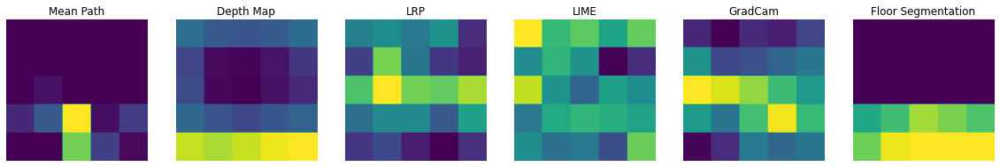

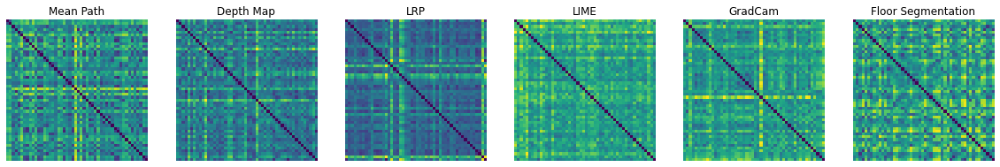

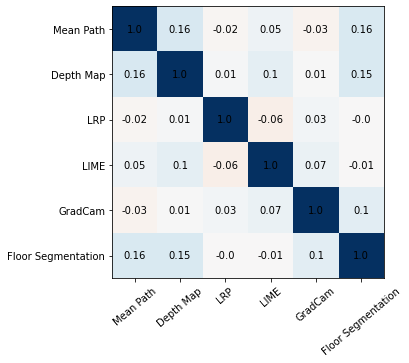

In [17]:
Bonner_5_rdms = plot_representational_geometries_with_corr(5)
np.save("C:\\Users\\cbartni\\surfdrive\\PhD\\SceneRepresentationXAI\\saved_RDM_arrays_CRS21\\Bonner_5_rdms.npy", Bonner_5_rdms)

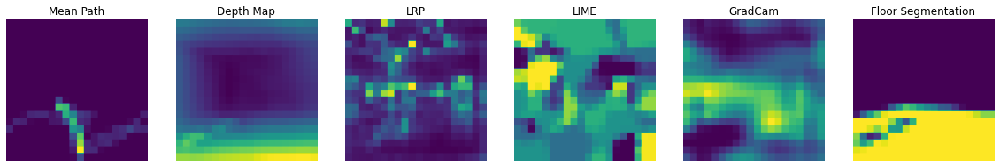

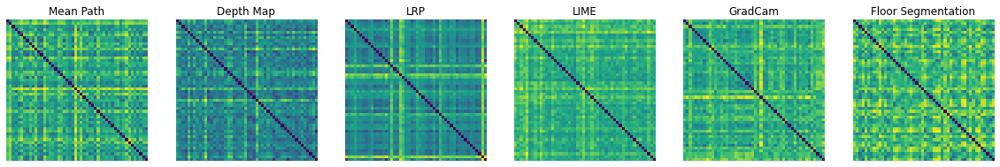

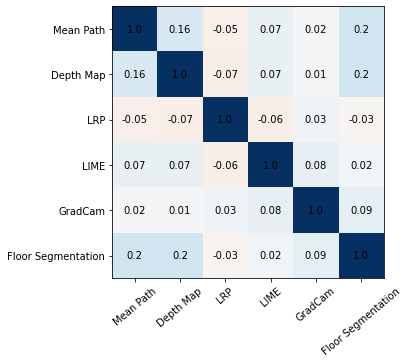

In [18]:
Bonner_20_rdms = plot_representational_geometries_with_corr(20)
np.save("C:\\Users\\cbartni\\surfdrive\\PhD\\SceneRepresentationXAI\\saved_RDM_arrays_CRS21\\Bonner_20_rdms.npy", Bonner_20_rdms)

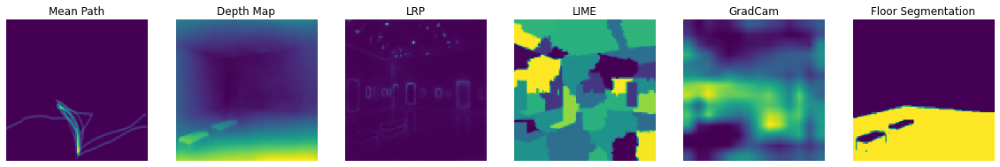

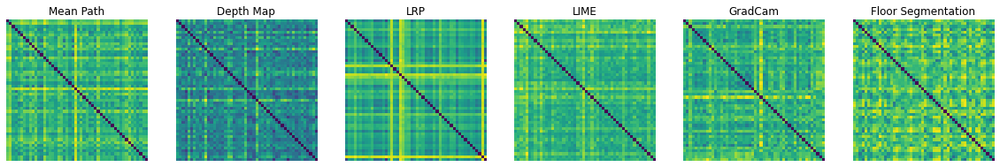

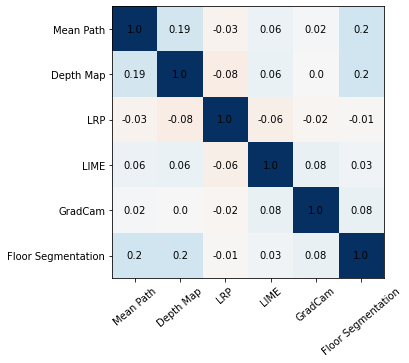

In [19]:
Bonner_100_rdms = plot_representational_geometries_with_corr(100)
np.save("C:\\Users\\cbartni\\surfdrive\\PhD\\SceneRepresentationXAI\\saved_RDM_arrays_CRS21\\Bonner_100_rdms.npy", Bonner_100_rdms)

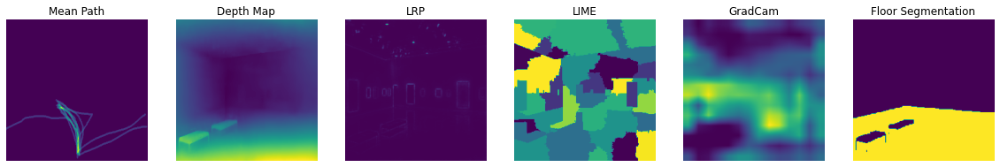

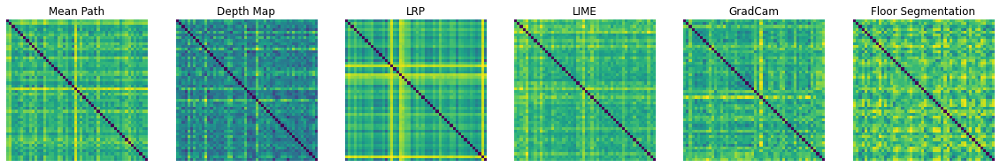

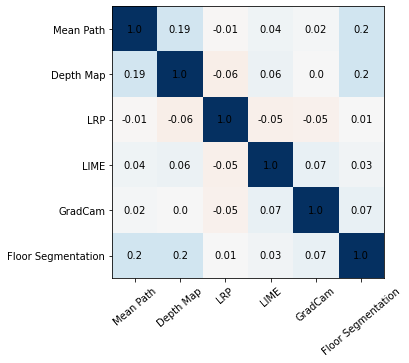

In [20]:
Bonner_224_rdms = plot_representational_geometries_with_corr(224)
np.save("C:\\Users\\cbartni\\surfdrive\\PhD\\SceneRepresentationXAI\\saved_RDM_arrays_CRS21\\Bonner_224_rdms.npy", Bonner_224_rdms)

# Vision for action Trajectory Analysis

# Helper Functions for VISACT


In [21]:
# The images are resized to the dimensions 540 by 540 pixels.
dim = (540, 540)

def open_image(image):
    '''
    This function opens a respective image and resizes is using opencv
    input: image-string: name of a image (without the file ending e.g ".jpg")
    
    return: img-array: array of the resized image
    '''
    img = np.array(Image.open('C:\\Users\\cbartni\\Dropbox\\PhD\\Vision_for_action\\final_images\\' + image + '.jpg'))
    img = cv2.resize(img, dim, interpolation = cv2.INTER_AREA)
    return img

############################################################################################

def compute_start_point_std(name):
    ''' 
    This function computes the 2D std for the start points of the trajectories: By computing a 
    center point and then taking the mean euclidean distance between all points with the center.
    
    !!Only trajectories longer then 5 rows are used. Because participants marked non-navigable 
    scenes with a simple point!!
    
    input: name -string: name of a image (without the file ending e.g ".jpg")
    
    returns std2D - float: 2d std of the point cloud
    '''
    x = []
    y = []
    for i in trajectories_dict[name].keys():
        # only use traj that are longer then 5 to sort out non-nav or to short trajectories
        if len(trajectories_dict[name][i]) > 5:
            x.append(trajectories_dict[name][i]["x"].iloc[0])
            y.append(trajectories_dict[name][i]["y"].iloc[0])
    
    # compute the center point
    center_point = np.array((np.mean(x), np.mean(y)))
    
    df = pd.DataFrame(data = zip(x,y), columns = ["x","y"])
    
    # compute the distances with the center point    
    dists = []
    for index, row in df.iterrows():
        b = np.array((row['x'],row['y']))
        dists.append(np.linalg.norm(center_point-b))
        
    std2D = np.mean(dists)
    
    return std2D

############################################################################################

def compute_goal_point_std(name):
    ''' 
    This function computes the 2D std for the goal points of the trajectories: By computing a 
    center point and then taking the mean euclidean distance between all points with the center.
    
    !!Only trajectories longer then 5 rows are used. Because participants marked non-navigable 
    scenes with a simple point!!
    
    input: name -string: name of a image (without the file ending e.g ".jpg")
    
    returns std2D - float: 2d std of the point cloud
    '''
    
    x = []
    y = []
    for i in trajectories_dict[name].keys():
        # only use traj that are longer then 5 to sort out non-nav or to short trajectories
        if len(trajectories_dict[name][i]) > 5:
            x.append(trajectories_dict[name][i]["x"].iloc[-1])
            y.append(trajectories_dict[name][i]["y"].iloc[-1])
    
    # compute the distances with the center point 
    center_point = np.array((np.mean(x), np.mean(y)))
    
    df = pd.DataFrame(data = zip(x,y), columns = ["x","y"])
        
    dists = []
    for index, row in df.iterrows():
        b = np.array((row['x'],row['y']))
        dists.append(np.linalg.norm(center_point-b))
        
    std2D = np.mean(dists)
    
    return std2D

############################################################################################

def plot_start_point_distribution(name, points = True, alpha = 0.4, contour = False, save_path = None):
    '''
    This function shows the respective image and plots the start points onto it. This can also be used to show
    the kde-distribution of the startpoints. 
    
    inputs: 
    name -string: name of a image (without the file ending e.g ".jpg")
    
    points -boolean: enables/disables the plotting of the start points (True is pre-set)
    
    alpha -float in range (0-1): transperency value of the kde-overlay.
    
    contour -boolean: enables/disables the plotting of the contours of the kde-plot (False is pre-set)
    
    save_path -string: if passed the resulting plot is saved to the specified path (None pre-set)
    
    return: std2D - which is the 2D std of the start points
    '''
    
    # open the image
    img = open_image(name)
    
    x = []
    y = []
    
    # create the figure
    fig, (ax1) = plt.subplots(1, 1, figsize = (5,5))
    #plot the image in the background
    ax1.imshow(img, zorder = 0)
    # extract the trajectories for the respective image
    for i in trajectories_dict[name].keys():
        # only use valid trajectories longer then 5
        if len(trajectories_dict[name][i]) > 5:
            if points == True:
                # we plot the first 3 pixels to get bigger points just for visualization purposes
                ax1.plot(trajectories_dict[name][i]["x"].iloc[:3],trajectories_dict[name][i]["y"].iloc[:3], linewidth=5, color = "orange", alpha = 0.9)
            
            # append the points to list for the kde-estimation    
            for k in trajectories_dict[name][i]["x"].iloc[:3]:
                x.append(k)
            for j in trajectories_dict[name][i]["y"].iloc[:3]:
                y.append(j)
    
    # create a df for the kde
    df = pd.DataFrame(data = zip(x,y), columns = ["x","y"])
    
    x = df["x"]
    y = df["y"]
    xmin, xmax = 0, 540
    ymin, ymax = 540, 0

    # Peform the kernel density estimate
    xx, yy = np.mgrid[xmin:xmax:100j, ymin:ymax:100j]
    positions = np.vstack([xx.ravel(), yy.ravel()])
    values = np.vstack([x, y])
    kernel = st.gaussian_kde(values)
    f = np.reshape(kernel(positions).T, xx.shape)

    #ax1.imshow(img)
    ax1 = fig.gca()
    ax1.set_xlim(xmin, xmax)
    ax1.set_ylim(ymin, ymax)
    # Contourf plot
    ax1.imshow(np.rot90(f), cmap='viridis', extent=[xmin, xmax, ymin, ymax], zorder = 1, alpha = alpha)
    # Contour plot
    ax1.set_xticks([]) 
    ax1.set_yticks([]) 
    if contour == True:
        cset = ax1.contour(xx, yy, f, colors='k', alpha = alpha)

    if save_path != None:
        plt.savefig(save_path + name + ".png", bbox_inches='tight')
        plt.close()
    else:
        plt.show()
    #print(compute_start_point_std(name))
    return compute_start_point_std(name)


##########################################################################################################

def plot_goal_point_distribution(name, points = True, alpha = 0.4, contour = True, save_path = None):
    '''
    This function shows the respective image and plots the goal points onto it. This can also be used to show
    the kde-distribution of the goalpoints. 
    
    inputs: 
    name -string: name of a image (without the file ending e.g ".jpg")
    
    points -boolean: enables/disables the plotting of the goal points (True is pre-set)
    
    alpha -float in range (0-1): transperency value of the kde-overlay.
    
    contour -boolean: enables/disables the plotting of the contours of the kde-plot (False is pre-set)
    
    save_path -string: if passed the resulting plot is saved to the specified path (None pre-set)
    
    return: std2D - which is the 2D std of the start points
    '''
    
    # open the image
    img = open_image(name)
    
    x = []
    y = []
    
    # create the figure
    fig, (ax1) = plt.subplots(1, 1, figsize = (5,5))
    #plot the image in the background
    ax1.imshow(img, zorder = 0)
    # extract the trajectories for the respective image
    for i in trajectories_dict[name].keys():
        # only use valid trajectories longer then 5
        if len(trajectories_dict[name][i]) > 5:
            if points == True:
                # we plot the last 3 pixels to get bigger points just for visualization purposes
                ax1.plot(trajectories_dict[name][i]["x"].iloc[-3:],trajectories_dict[name][i]["y"].iloc[-3:], linewidth=5, color = "deeppink", alpha = 0.9)
            
            # append the points to list for the kde-estimation    
            for k in trajectories_dict[name][i]["x"].iloc[-3:]:
                x.append(k)
            for j in trajectories_dict[name][i]["y"].iloc[-3:]:
                y.append(j)
    
    # create a df for the kde
    df = pd.DataFrame(data = zip(x,y), columns = ["x","y"])
    
    x = df["x"]
    y = df["y"]
    xmin, xmax = 0, 540
    ymin, ymax = 540, 0

    # Peform the kernel density estimate
    xx, yy = np.mgrid[xmin:xmax:100j, ymin:ymax:100j]
    positions = np.vstack([xx.ravel(), yy.ravel()])
    values = np.vstack([x, y])
    kernel = st.gaussian_kde(values)
    f = np.reshape(kernel(positions).T, xx.shape)

    #fig, (ax1) = plt.subplots(1, 1, figsize = (5,5))
    #ax1.imshow(img)
    ax1 = fig.gca()
    ax1.set_xlim(xmin, xmax)
    ax1.set_ylim(ymin, ymax)
    # Contourf plot
    ax1.imshow(np.rot90(f), cmap='viridis', extent=[xmin, xmax, ymin, ymax], zorder = 1, alpha = alpha)
    ax1.set_xticks([]) 
    ax1.set_yticks([]) 
    # Contour plot
    if contour == True:
        cset = ax1.contour(xx, yy, f, colors='k', alpha = alpha)
    
    if save_path != None:
        plt.savefig(save_path + name + ".png", bbox_inches='tight')
        plt.close()
    else:
        plt.show()
    
    return compute_goal_point_std(name)

###########################################################################################################

def plot_image_and_Trajs(name):
    '''
    Function plots the image and the respective trajectories
    
    input:
    name -string: name of a image (without the file ending e.g ".jpg")
    '''

    img = open_image(name)
    lenth = len(trajectories_dict[name].keys())
    
    fig, (ax1) = plt.subplots(1, 1, figsize = (15,5))
    ax1.imshow(img, zorder = 0)
    for i in trajectories_dict[name].keys():
        
        ax1.plot(trajectories_dict[name][i]["x"],trajectories_dict[name][i]["y"], linewidth=5, color = "red")
    ax1.set_xticks([]) 
    ax1.set_yticks([]) 
    plt.show()
    
###########################################################################################################
    
def interpolate_trajectories(base, to_resample):
    """
    requires package: from scipy.interpolate import interp1d
    ---- 
    
    interpolate_trajectories resamples an df with xy-coords "to_resample"
                             to have the same number of observations as the "base" df.

    :param base: df with xy-coords - with the desired length of observations 
    :param to_resample: df with xy-coords -  that gets resampled to have the same number of observations as base
    
    :return: resampled_traj - resampled version of "to_resample" with the same number of obs. as base
    """
    
    
    base_length = len(base)
    arr_ref = np.array(np.arange(0,base_length,1))  # reference
    
    to_resample_length = len(to_resample)
    arr2 = np.array(np.arange(0, to_resample_length,1))
    
    arr2_interp = interp1d(np.arange(arr2.size),arr2)
    arr2_stretch = arr2_interp(np.linspace(0,arr2.size-1,arr_ref.size))
    arr2_stretch.round(0)
    
    resampled_traj = base.copy()
    resampled_traj = to_resample.iloc[arr2_stretch.round(0)]
    resampled_traj = resampled_traj.reset_index(drop=True)
    return resampled_traj   



####################################################################################################

def compute_traj_dist(image, measure = "frechet_dist"):
    '''
    Function computes the distance for each trajectories in the respective image
    
    input: 
    image - string: name of a image (without the file ending e.g ".jpg")
    
    measure - string: measure that should be used. - we use frechet_dist but dtw (dynamic time warping) is also possible
    
    return: 
    mean - float: mean pairwise distance between all trajectories.
    '''
    
    # extract the respective trajectories 
    traj_dict = trajectories_dict[image]
    
    # get all keys - which are the individual pathes drawn ~20
    keys = list(traj_dict.keys())     
    
    # compute the pairwise distance between all trajectory pairs        
    distances = []
    # get the indecies for the lower triangle to save computations
    iu1, iu2 = np.triu_indices(len(traj_dict.keys()), k = 1)
             
    
    for count1, i in enumerate(iu1):
 
        num_data = np.zeros((len(traj_dict[keys[iu1[count1]]]), 2))
        num_data[:, 0] = traj_dict[keys[iu1[count1]]]["x"]
        num_data[:, 1] = traj_dict[keys[iu1[count1]]]["y"]

        exp_data = np.zeros((len(traj_dict[keys[iu2[count1]]]), 2))
        exp_data[:, 0] = traj_dict[keys[iu2[count1]]]["x"]
        exp_data[:, 1] = traj_dict[keys[iu2[count1]]]["y"]
        
        # select the used distance measure
        if measure == "frechet_dist":
            distances.append(similaritymeasures.frechet_dist(num_data, exp_data))
        elif measure == "dtw":
            dtw, d = similaritymeasures.dtw(num_data, exp_data)
            distances.append(dtw)
            
            
    # maybe it could be sensible to compute a trimmed mean to not be influenced by outliers.
    # Currently only mean
    # compute the trimmed mean 
    #mean = stats.trim_mean(X, proportiontocut = 0)
    mean = np.mean(distances)
    return mean

########################################################################################################



## Stimuli

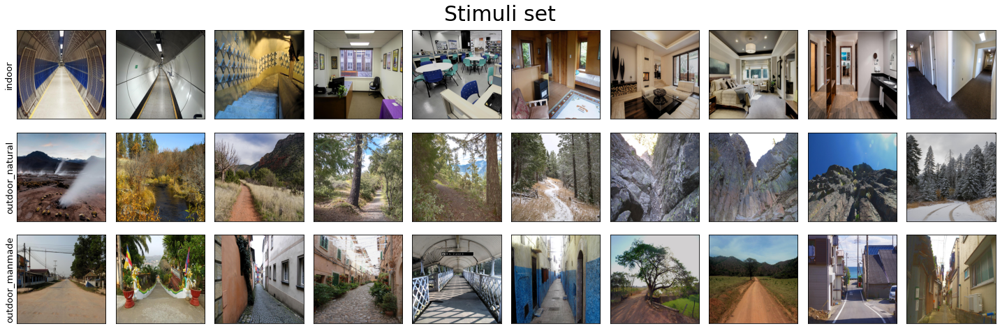

In [22]:
# Plotting the images

# create a list containing all images
image_dir = "C:\\Users\\cbartni\\Dropbox\PhD\\Vision_for_action\\final_images\\"
image_list = []
for image in os.listdir(image_dir):
    if image[0] == "0":
        image_list.append(image)    

# creating individual lists for each type of environment        
indoor_list = []
natural_list = []
manmade_list = []
for image in os.listdir(image_dir):
    if "indoor" in image:
        indoor_list.append(image)
    elif "natural" in image:
        natural_list.append(image)
    else:
        manmade_list.append(image)
        
environments = ["indoor", "outdoor_natural", "outdoor_manmade"]
num_images = 10

fig, axs = plt.subplots(len(environments), num_images, figsize=(20, 7))
for row in range(len(environments)):
    imgs = []
    for i in image_list:
        if environments[row] in i:
            imgs.append(image_dir + i)
    for column in range(num_images):
        axs[row, column].imshow(np.array(Image.open(imgs[column])))
        axs[row, column].set_xticks([])
        axs[row, column].set_yticks([])
        axs[row, 0].set_ylabel(environments[row], fontsize=13)
        
fig.suptitle('Stimuli set', fontsize=30, y = 0.95)
fig.tight_layout()
plt.show()

In the behavioral experiment we captured the path drawings for all our 231 images by 152 participants. Resulting in over 5000 individual paths and over 20 paths for each image. The Gorilla experiment builder only provides ".jpg" images of the participants drawing we needed to manually redraw all paths to get the x-y-coordinates of the images.

## Redrawn Paths

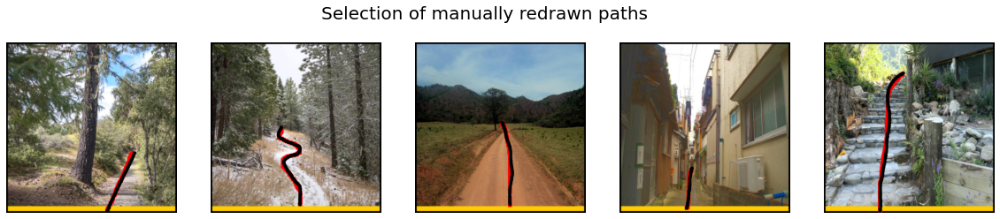

In [23]:
num_redrawn_paths = 5   # number of redrawn paths that should be presented

# Directory of the redrawn paths as ".png" and the respective coords as ".csv"
redrawn_path_dir = "C:\\Users\\cbartni\\surfdrive\\PhD\\VisionforAction\\Path_annotations\\redrawn_paths\\"

redrawn_path_list = []
for file in os.listdir(redrawn_path_dir):
    if file[-4:] == ".png":
        redrawn_path_list.append(file)
        
fig, ax = plt.subplots(1,num_redrawn_paths, figsize=(20, 4))
for i in range(num_redrawn_paths):
    ax[i].imshow(np.array(Image.open(redrawn_path_dir + redrawn_path_list[i])))
    ax[i].axis("off")

plt.suptitle("Selection of manually redrawn paths", fontsize = 20)
plt.show(block = False)

In [24]:
# Now we load in all trajectories

# create an empty dict to store all trajectories
trajectories_dict = {}

for img in image_list:
    # iterate over all images
    img_name = img[:-4]
    filename = img[:-4] + "_Drawing.jpg"
    count = 0
    # create a new dict for each image in which we fill the x-y-coords for each drawing (participant)
    traj_dict = {}
    for files in os.listdir(redrawn_path_dir):
        pathname = "path_" + str(count)
        if filename in files and files[-4:] == ".csv":
            df = pd.read_csv(redrawn_path_dir + files, header = None, names= ("x", "y"))
            # check if the x-y-coords file is empty
            if df.empty == False:
                traj_dict[pathname] = pd.read_csv(redrawn_path_dir + files, header = None, names= ("x", "y"))
                count +=1
    # fill the sub dict into the main dict            
    trajectories_dict[img_name] = traj_dict

## Start points

First we look at the different start points.

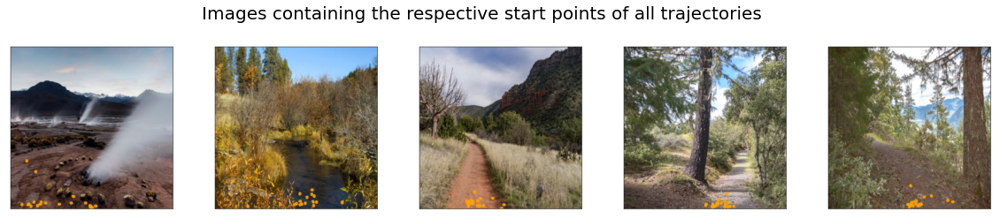

In [25]:
num_start_point_imgs = 5   # number of redrawn paths that should be presented

# Directory of the images containing the start points created using the plot_start_point_distribution function
start_point_dir = "C:\\Users\\cbartni\\surfdrive\\PhD\\SceneRepresentationXAI\\Start_point_distributions\\Start_point_images\\"

start_point_img_list = []
for file in os.listdir(start_point_dir):
    if file[-4:] == ".png":
        start_point_img_list.append(file)
        
fig, ax = plt.subplots(1,num_start_point_imgs, figsize=(20, 4))
for i in range(num_start_point_imgs):
    ax[i].imshow(np.array(Image.open(start_point_dir + start_point_img_list[i])))
    ax[i].axis("off")

plt.suptitle("Images containing the respective start points of all trajectories ", fontsize = 20)
plt.show(block = False)

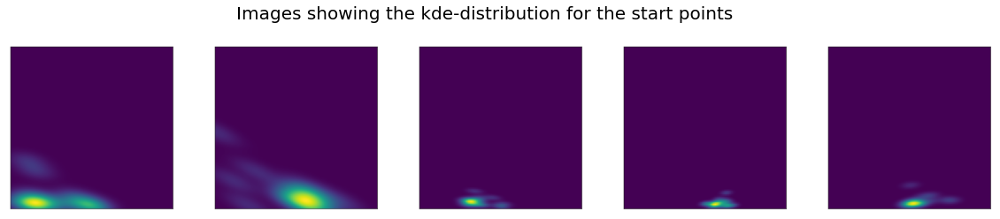

In [26]:
num_start_point_imgs = 5   # number of redrawn paths that should be presented

# Directory of the images containing the start points created using the plot_start_point_distribution function
start_point_dir = "C:\\Users\\cbartni\\surfdrive\\PhD\\SceneRepresentationXAI\\Start_point_distributions\\"

start_point_img_list = []
for file in os.listdir(start_point_dir):
    if file[-4:] == ".png":
        start_point_img_list.append(file)
        
fig, ax = plt.subplots(1,num_start_point_imgs, figsize=(20, 4))
for i in range(num_start_point_imgs):
    ax[i].imshow(np.array(Image.open(start_point_dir + start_point_img_list[i])))
    ax[i].axis("off")

plt.suptitle("Images showing the kde-distribution for the start points", fontsize = 20)
plt.show(block = False)

Now we plot the distribution of the std2D for all start point images.

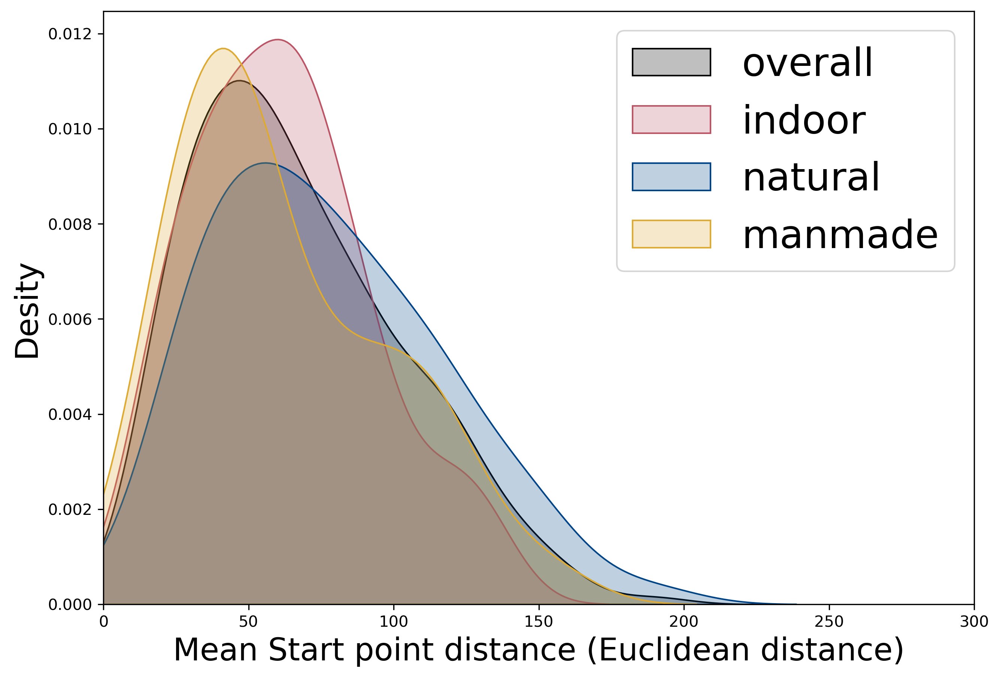

In [92]:
start_dist_indoor = []
start_dist_natural = []
start_dist_manmade = []
all_start_dist = []
for img in image_list:
    all_start_dist.append(compute_start_point_std(img[:-4]))
    if "indoor" in img:
        start_dist_indoor.append(compute_start_point_std(img[:-4]))
    elif "natural" in img:
        start_dist_natural.append(compute_start_point_std(img[:-4]))
    else:
        start_dist_manmade.append(compute_start_point_std(img[:-4]))


sns.color_palette("muted")
plt.figure(figsize=(10,7), dpi= 300)
sns.distplot(all_start_dist, color="#000000", label="overall", hist=False, kde_kws={"shade": True})
sns.distplot(start_dist_indoor, color="#BB5566", label="indoor", hist=False, kde_kws={"shade": True})
sns.distplot(start_dist_natural, color="#004488", label="natural", hist=False, kde_kws={"shade": True})
sns.distplot(start_dist_manmade, color="#DDAA33", label="manmade", hist=False, kde_kws={"shade": True})
plt.xlim(0,300)
plt.ylabel("Desity", fontsize = 20)
plt.xlabel("Mean Start point distance (Euclidean distance)", fontsize = 20)
plt.legend(fontsize = 25)

#save plot
plt.savefig("C:\\Users\\cbartni\\surfdrive\\PhD\\SceneRepresentationXAI\\poster_images\\" + "start_point" + '.svg', bbox_inches='tight')
plt.show()



## Goal points

Now we take a look at the goal points - which give us a representation wheater or not participants choose the same goal to which they would navigate. Remember each participant only drew one line and the task was how would you navigate through the scene with any possible navigational action. 

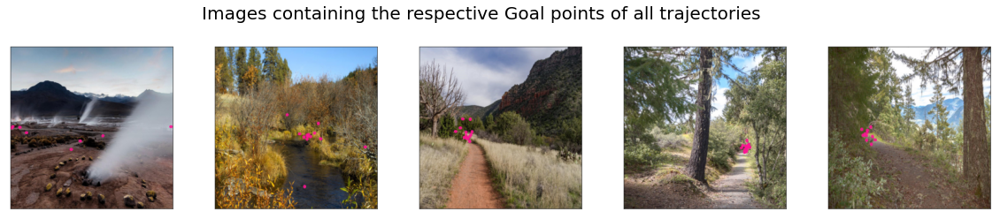

In [28]:
num_goal_point_imgs = 5   # number of redrawn paths that should be presented

# Directory of the images containing the start points created using the plot_start_point_distribution function
goal_point_dir = "C:\\Users\\cbartni\\surfdrive\\PhD\\SceneRepresentationXAI\\Goal_point_distributions\\Goal_point_imgs\\"

goal_point_img_list = []
for file in os.listdir(goal_point_dir):
    if file[-4:] == ".png":
        goal_point_img_list.append(file)
        
fig, ax = plt.subplots(1,num_goal_point_imgs, figsize=(20, 4))
for i in range(num_start_point_imgs):
    ax[i].imshow(np.array(Image.open(goal_point_dir + goal_point_img_list[i])))
    ax[i].axis("off")

plt.suptitle("Images containing the respective Goal points of all trajectories ", fontsize = 20)
plt.show(block = False)

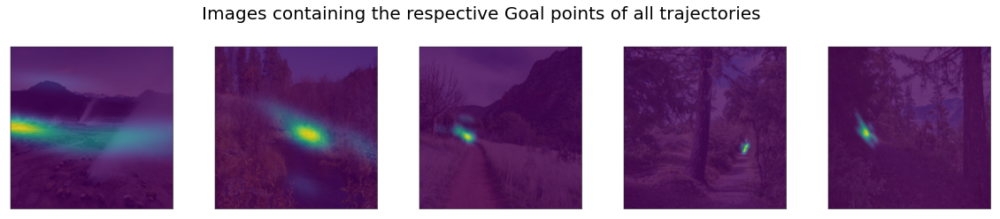

In [29]:
num_goal_point_imgs = 5   # number of redrawn paths that should be presented

# Directory of the images containing the start points created using the plot_start_point_distribution function
goal_point_dir = "C:\\Users\\cbartni\\surfdrive\\PhD\\SceneRepresentationXAI\\Goal_point_distributions\\"

goal_point_img_list = []
for file in os.listdir(goal_point_dir):
    if file[-4:] == ".png":
        goal_point_img_list.append(file)
        
fig, ax = plt.subplots(1,num_goal_point_imgs, figsize=(20, 4))
for i in range(num_start_point_imgs):
    ax[i].imshow(np.array(Image.open(goal_point_dir + goal_point_img_list[i])))
    ax[i].axis("off")

plt.suptitle("Images containing the respective Goal points of all trajectories ", fontsize = 20)
plt.show(block = False)

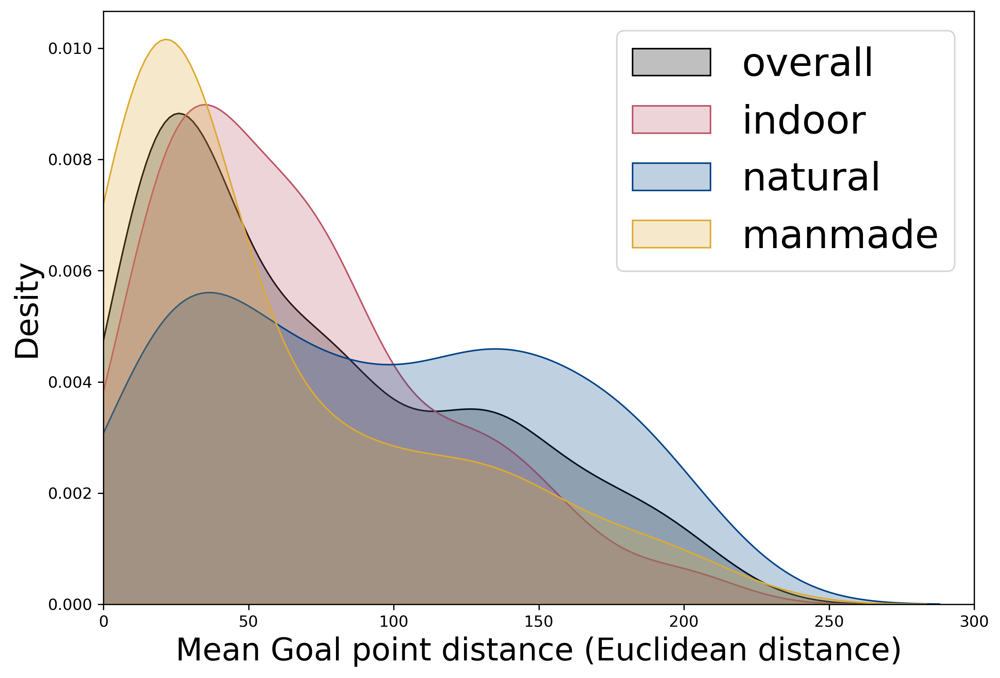

In [93]:
goal_dist_indoor = []
goal_dist_natural = []
goal_dist_manmade = []
all_goal_dists = []
for img in image_list:
    all_goal_dists.append(compute_goal_point_std(img[:-4]))
    if "indoor" in img:
        goal_dist_indoor.append(compute_goal_point_std(img[:-4]))
    elif "natural" in img:
        goal_dist_natural.append(compute_goal_point_std(img[:-4]))
    else:
        goal_dist_manmade.append(compute_goal_point_std(img[:-4]))

# Plot
sns.color_palette("muted")
plt.figure(figsize=(10,7), dpi= 300)
sns.distplot(all_goal_dists, color="#000000", label="overall", hist=False, kde_kws={"shade": True})
sns.distplot(goal_dist_indoor, color="#BB5566", label="indoor", hist=False, kde_kws={"shade": True})
sns.distplot(goal_dist_natural, color="#004488", label="natural", hist=False, kde_kws={"shade": True})
sns.distplot(goal_dist_manmade, color="#DDAA33", label="manmade", hist=False, kde_kws={"shade": True})
plt.xlim(0,300)
plt.ylabel("Desity", fontsize = 20)
plt.xlabel("Mean Goal point distance (Euclidean distance)", fontsize = 20)
plt.legend(fontsize = 25)
plt.savefig("C:\\Users\\cbartni\\surfdrive\\PhD\\SceneRepresentationXAI\\poster_images\\" + "goal_point" + '.svg', bbox_inches='tight')
plt.show()

## Similarity between trajectories (Frechet Distance)

Compute the similarity between the different trajectories:

In [31]:
# Load in the already precomputed distance data for the frechet distance
df_frechet = pd.read_csv("C:\\Users\\cbartni\\surfdrive\\PhD\\SceneRepresentationXAI\\Coherence_data\\frechet_distance.csv")

# we split it by the different kinds of environments
all_frechet = df_frechet["coherence"]
indoor_frechet = []
manmade_frechet = []
natural_frechet = []

for img in image_list:
    x = df_frechet[df_frechet["images"] == img]
    value = x["coherence"].values[0]
    if "indoor" in img:
        indoor_frechet.append(value)
    elif "natural" in img:
        natural_frechet.append(value)
    else:
        manmade_frechet.append(value)

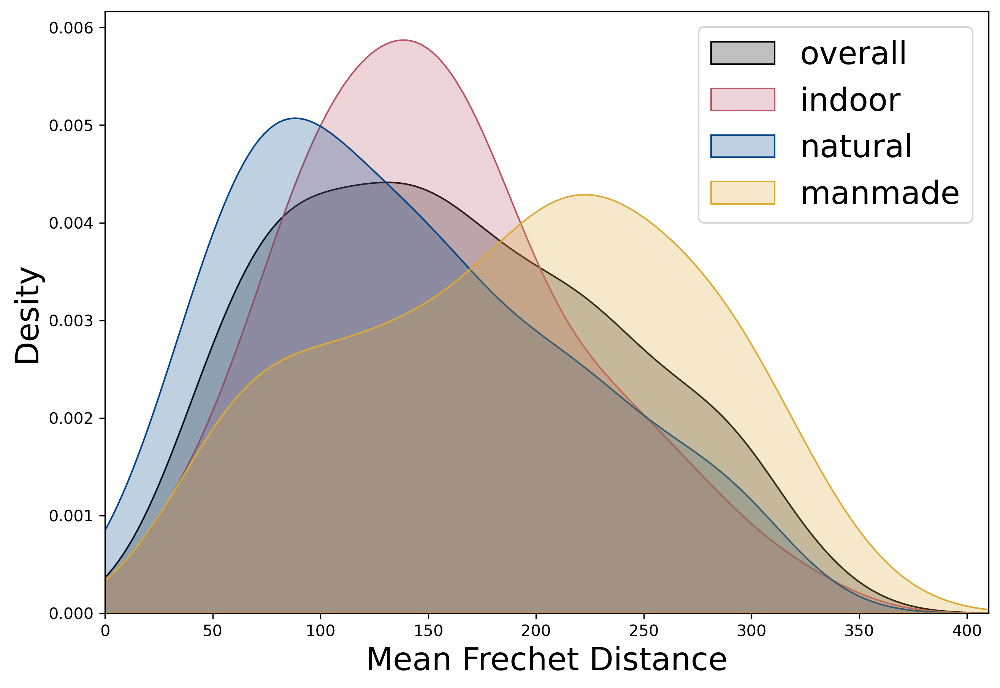

In [95]:
# Plot
plt.figure(figsize=(10,7), dpi= 300)
sns.color_palette("muted")
sns.distplot(all_frechet, color="#000000", label="overall", hist=False, kde_kws={"shade": True})
sns.distplot(indoor_frechet, color="#BB5566", label="indoor", hist=False, kde_kws={"shade": True})
sns.distplot(manmade_frechet, color="#004488", label="natural", hist=False, kde_kws={"shade": True})
sns.distplot(natural_frechet, color="#DDAA33", label="manmade", hist=False, kde_kws={"shade": True})
plt.xlim(0,410)
plt.ylabel("Desity", fontsize = 20)
plt.xlabel("Mean Frechet Distance", fontsize = 20)
plt.legend(fontsize = 20)
plt.savefig("C:\\Users\\cbartni\\surfdrive\\PhD\\SceneRepresentationXAI\\poster_images\\" + "Frechet_Distance" + '.svg', bbox_inches='tight')
plt.show()

                       images  coherence
141  0176_outdoor_manmade.jpg  27.871078


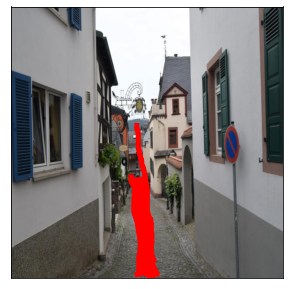

In [33]:
# Plot the image with the lowest Mean Frechet Distance 

print(df_frechet[df_frechet["coherence"] == df_frechet["coherence"].min()])

plot_image_and_Trajs("0176_outdoor_manmade")

              images   coherence
183  0232_indoor.jpg  161.913711
186  0235_indoor.jpg  161.741252
187  0236_indoor.jpg  160.702017


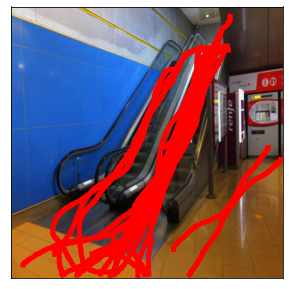

In [34]:
# Plot a image with a Mean Frechet Distance close to the overall mean
print(df_frechet[(df_frechet["coherence"] < (np.mean(df_frechet["coherence"]) + 1)) & (df_frechet["coherence"] > (np.mean(df_frechet["coherence"]) - 1))])

plot_image_and_Trajs("0235_indoor")

                      images   coherence
46  0062_outdoor_natural.jpg  337.301666


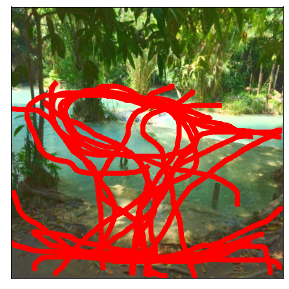

In [35]:
# Plot the image with the highest Mean Frechet Distance 
print(df_frechet[df_frechet["coherence"] == df_frechet["coherence"].max()])

plot_image_and_Trajs("0062_outdoor_natural")

#  Vision for Action comparision between different spaces

In [36]:
def plot_img_next_to_other_representation(number_img, other_representation_array, other_rep_name): 
    
    dim = (224,224)
    img = np.array(Image.open(image_dir + image_list[number_img]))
    img_resized = img = cv2.resize(img, dim, interpolation = cv2.INTER_AREA)

    fig, axs = plt.subplots(1, 2, figsize=(5, 5))
    axs[0].set_title("Stimuli")
    axs[0].imshow(img_resized)
    axs[0].axis("off")

    axs[1].set_title(other_rep_name)
    axs[1].imshow(other_representation_array[number_img])
    axs[1].axis("off")


    plt.show() 
    
#########################################################################################################

def save_all_image_reps(count, n_slices, save_path): 
    
    img_lrp = normalize_2D(lrp_array[count])
    img_lime = normalize_2D(LIME_array[count])
    img_mean_path = normalize_2D(mean_path_array[count])
    img_depth = normalize_2D(depthmap_arrays[count])
    img_Grad = normalize_2D(Grad_cam_arrays[count])
    img_seg = normalize_2D(floor_seg_arrays[count])
    
    split_lrp, lrp_means = split_image_into_tiles(img_lrp, n_slices, method = "mean")
    split_lime, lime_means = split_image_into_tiles(img_lime, n_slices, method = "mean")
    split_path, path_means = split_image_into_tiles(img_mean_path, n_slices, method = "mean")
    split_depth, depth_means = split_image_into_tiles(img_depth, n_slices, method = "mean")
    split_Grad, grad_means = split_image_into_tiles(img_Grad, n_slices, method = "mean")
    split_seg, seg_means = split_image_into_tiles(img_seg, n_slices, method = "mean")
    
    list_of_images = [split_path, split_depth, split_lrp, split_lime, split_Grad, split_seg]
    names = ["Mean Path", "Depth Map", "LRP", "LIME", "Grad Cam", "Floor Segmentation"]
    
    for i in range(len(list_of_images)):
        
        fig,ax = plt.subplots(1,1, figsize=(10, 10))
   
        #ax.set_title(names[i])
        ax.imshow(list_of_images[i])
        ax.axis("off")
        
        plt.savefig(save_path + str(count) + '_' + str(n_slices) + '_' + names[i] + '.png', bbox_inches='tight', dpi = 300)
        plt.close()
        
        
#########################################################################################################
def plot_all_splits_side_by_side_VISACT(count, n_slices, method = "mean"):
    
    img_lrp = normalize_2D(lrp_array[count])
    img_lime = normalize_2D(LIME_array[count])
    img_mean_path = normalize_2D(mean_path_array[count])
    img_depth = normalize_2D(depthmap_arrays[count])
    img_Grad = normalize_2D(Grad_cam_arrays[count])
    img_seg = normalize_2D(floor_seg_arrays[count])
    
    split_lrp, lrp_means = split_image_into_tiles(img_lrp, n_slices, method = method)
    split_lime, lime_means = split_image_into_tiles(img_lime, n_slices, method = method)
    split_path, path_means = split_image_into_tiles(img_mean_path, n_slices, method = method)
    split_depth, depth_means = split_image_into_tiles(img_depth, n_slices, method = method)
    split_Grad, grad_means = split_image_into_tiles(img_Grad, n_slices, method = method)
    split_seg, seg_means = split_image_into_tiles(img_seg, n_slices, method = method)
    
    list_of_images = [split_path, split_depth, split_lrp, split_lime, split_Grad, split_seg]
    names = ["Mean Path", "Depth Map", "LRP", "LIME", "Grad Cam", "Floor Segmentation"]
    fig,ax = plt.subplots(1,len(list_of_images), figsize=(20, 10))
    for i,img in enumerate(list_of_images):
        ax[i].set_title(names[i])
        ax[i].imshow(img)
        ax[i].axis("off")
        
    plt.show(block = False)
    
    # compute correlation
    list_of_means = [path_means, depth_means, lrp_means, lime_means, grad_means, seg_means]

    overview = np.zeros([len(list_of_means), len(list_of_means)])
    for count1, base in enumerate(list_of_means):
        for count2, second in enumerate(list_of_means):
            rdm_corr, pval = kendalltau(base, second)
            overview[count1, count2] = rdm_corr

    fig,ax = plt.subplots(1,1, figsize=(5, 5))
    ax.imshow(overview, vmin = -1, vmax = 1, cmap = "RdBu")
    
    for (j,i),label in np.ndenumerate(overview):
        ax.text(i,j,label.round(2),ha='center',va='center')
    
    ax.set_yticks(np.arange(len(list_of_means)))
    ax.set_xticks(np.arange(len(list_of_means)))
    ax.set_yticklabels(names)
    ax.set_xticklabels(names, rotation=40)
    plt.show(block = False)

##################################################################################################

def plot_representational_geometries_with_corr_VISACT(n_slices, subset = "all"):
    '''
    This function splits the images into the specified number of slices and computes the pair-wise similiarity 
    between all other images and thereby creates a representational space for each input modality/representation.   
    
    input: n_slices - int: number of slices in which the image should be split along each axis
    
    output: plots the representations side by side and a overview showing the correlations (kendall's tau) between them.
    
    '''
    
    if subset == "all":
        idx = np.arange(231)
    elif subset == "indoor":
        idx = indoor_idx
    elif subset == "natural":
        idx = natural_idx
    elif subset == "manmade":
        idx = manmade_idx
        
    # Select the number of slices
    length_of_means = n_slices * n_slices
    names = ["Mean Path", "Depth Map", "LRP", "LIME", "GradCam", "Floor Segmentation"]
    mean_array = np.zeros([len(idx), len(names), length_of_means])
    
    method = "mean"
    for number, count in enumerate(idx):
        #print("Processing Image: " , count)

        img_lrp = normalize_2D(lrp_array[count])
        img_lime = normalize_2D(LIME_array[count])
        img_mean_path = normalize_2D(mean_path_array[count])
        img_depth = normalize_2D(depthmap_arrays[count])
        img_Grad = normalize_2D(Grad_cam_arrays[count])
        img_seg = normalize_2D(floor_seg_arrays[count])

        split_lrp, lrp_means = split_image_into_tiles(img_lrp, n_slices, method = method)
        split_lime, lime_means = split_image_into_tiles(img_lime, n_slices, method = method)
        split_path, path_means = split_image_into_tiles(img_mean_path, n_slices, method = method)
        split_depth, depth_means = split_image_into_tiles(img_depth, n_slices, method = method)
        split_Grad, grad_means = split_image_into_tiles(img_Grad, n_slices, method = method)
        split_seg, seg_means = split_image_into_tiles(img_seg, n_slices, method = method)

        list_of_means = [path_means, depth_means, lrp_means, lime_means, grad_means, seg_means]
        for count2, i in enumerate(list_of_means):
            mean_array[number][count2] = i

    list_of_images = [split_path, split_depth, split_lrp, split_lime, split_Grad, split_seg]
    
    fig,ax = plt.subplots(1,len(list_of_images), figsize=(20, 10))
    for i,img in enumerate(list_of_images):
        ax[i].set_title(names[i])
        ax[i].imshow(img)
        ax[i].axis("off")
        
    plt.show(block = False)
    
    # Compute the RDMs and the RDVs

    rdms = np.zeros([len(names),len(idx),len(idx)])
    num_flatten = int(len(idx) * (len(idx) - 1) / 2)
    rdvs = np.zeros([len(names), num_flatten])
    for i in range(len(names)):
        rdms[i] = pairwise_distances(mean_array[:,i] , metric= 'euclidean')
        rdvs[i] = squareform(rdms[i].round(5))


    # Plot the resulting representational geometries across all 50 images

    #RDM_names = ["Mean Path", "Depth Map", "LRP", "LIME", "Floor Seg"]

    fig,ax = plt.subplots(1,len(rdms), figsize=(20, 10))
    for i,rdm in enumerate(rdms):
        ax[i].set_title(names[i])
        ax[i].imshow(rdm)
        ax[i].axis("off")

    # compute the correlation between the representational geometries
    overview = np.zeros([len(rdvs), len(rdvs)])
    for count1, base in enumerate(rdvs):
        for count2, second in enumerate(rdvs):
            rdm_corr, pval = kendalltau(base, second)
            overview[count1, count2] = rdm_corr

    # Plot the correlation matrix between the representatinal geometries

    fig,ax = plt.subplots(1,1, figsize=(5, 5))
    ax.imshow(overview, vmin = -1, vmax = 1, cmap = "RdBu")

    for (j,i),label in np.ndenumerate(overview):
        ax.text(i,j,label.round(2),ha='center',va='center')

    ax.set_yticks(np.arange(len(names)))
    ax.set_xticks(np.arange(len(names)))
    ax.set_yticklabels(names)
    ax.set_xticklabels(names, rotation=40)
    plt.show(block = False)
    
    return rdms

In [37]:
indoor_idx = []
natural_idx = []
manmade_idx = []
for count, image in enumerate(os.listdir("C:\\Users\\cbartni\\Dropbox\\PhD\\Vision_for_action\\final_images\\")):
    if "indoor" in image:
        indoor_idx.append(count)
    elif "natural" in image:
        natural_idx.append(count)
    elif "manmade" in image:
        manmade_idx.append(count)


## Load the different representations for the VISACT stimuli:

## Mean Path

In [38]:
os.chdir(r"C:\Users\cbartni\surfdrive\PhD\VisionforAction\Behavioral_Experiment_Analysis\Drawing_task_precomputed")
import drawing_task_utils 

drawings_dir = "C:\\Users\\cbartni\\Dropbox\\PhD\\Vision_for_action\\Prolific_DataCollection\\final_batch\\uploads\\"


mean_array, mean_image_list, mean_particiant_count = drawing_task_utils.generate_mean_heatmaps(precomputed = False)

#Sort the Images acording to the image_list

mean_path_array = mean_array.copy()
for count, i in enumerate(image_list):
    mean_path_array[count] = mean_array[mean_image_list.index(image_list[count].split("\\")[-1])]

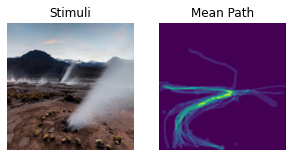

In [39]:
plot_img_next_to_other_representation(0, mean_path_array, "Mean Path")

## Depth Map

In [40]:
depth_dir = "C:\\Users\\cbartni\\surfdrive\\PhD\\SceneRepresentationXAI\\XAIReps\\depth_output\\"

depthmap_arrays = np.zeros([len(image_list), 224, 224])
for count, img in enumerate(image_list):
    depthmap = Image.open(depth_dir + img[:-4] + ".png")
    depthmap = np.array(depthmap, dtype='float64')
    depthmap_resized = cv2.resize(depthmap, (224,224))
    depthmap_arrays[count] = depthmap_resized

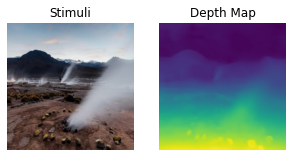

In [41]:
plot_img_next_to_other_representation(0, depthmap_arrays, "Depth Map")

## Layer-Wise Relevance Propagation (LRP)

In [42]:
npy_array_dir = "C:\\Users\\cbartni\\surfdrive\\PhD\\SceneRepresentationXAI\\XAIReps\\LRP\\"

lrp_array = np.zeros([len(image_list), 224, 224])
for count, img in enumerate(image_list):
    name = npy_array_dir + img[:-4] + "_lrp.npy"
    lrp_array[count] = np.load(name)

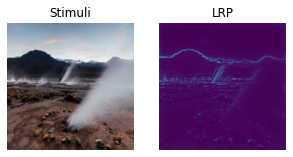

In [43]:
plot_img_next_to_other_representation(0, lrp_array, "LRP")

## LIME (Local Interpretable Model-agnostic Explanations)

In [44]:
LIME_dir = "C:\\Users\\cbartni\\surfdrive\\PhD\\SceneRepresentationXAI\\XAIReps\\LIME\\"

LIME_array = np.zeros([len(image_list), 224, 224])
for count, img in enumerate(image_list):
    name = LIME_dir + img[:-4] + "_LIME.npy"
    LIME_array[count] = np.load(name)

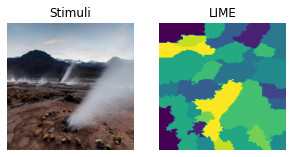

In [45]:
plot_img_next_to_other_representation(0, LIME_array, "LIME")

## GradCam

In [46]:
GradCam_dir = "C:\\Users\\cbartni\\surfdrive\\PhD\\SceneRepresentationXAI\\XAIReps\\GradCam_VGG16\\Output\\"

Grad_cam_arrays = np.zeros([len(image_list), 224, 224])
for count, img in enumerate(image_list):
    Grad_cam_arrays[count] = cv2.resize(np.load(GradCam_dir + img[:-4] + "_block5_conv3_.npy"),(224, 224))

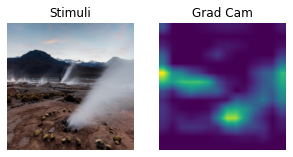

In [47]:
plot_img_next_to_other_representation(0, Grad_cam_arrays, "Grad Cam")

## Floor Segmentation

In [48]:
floor_seg_dir = "C:\\Users\\cbartni\\surfdrive\\PhD\\SceneRepresentationXAI\\VISACT_floor_seg\\"

floor_seg_arrays = np.load(floor_seg_dir + "VISACT_floor_seg_arrays.npy")
floor_seg_labels = pd.read_csv(floor_seg_dir + "VISACT_floor_seg.csv", index_col = "Unnamed: 0")

## Interactive Comparision VISACT

In [49]:
widgets.interact(plot_all_splits_side_by_side_VISACT, count = (0,231,1), n_slices = (1, 224, 1), method = ["mean", "min", "max"])

interactive(children=(IntSlider(value=115, description='count', max=231), IntSlider(value=112, description='n_…

<function __main__.plot_all_splits_side_by_side_VISACT(count, n_slices, method='mean')>

## Correlations between Representational Geometries:

We compare the different representational geometries. By specificing different numbers of slices we can see how the representational geometries change with different image resolutions. 

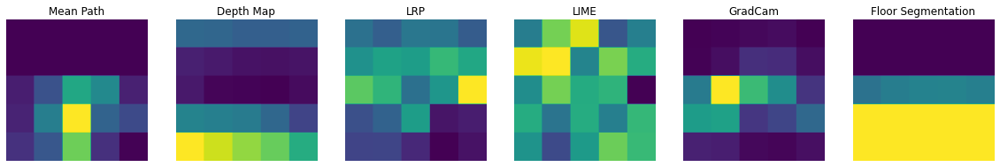

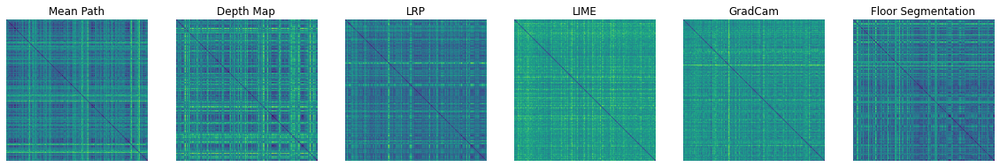

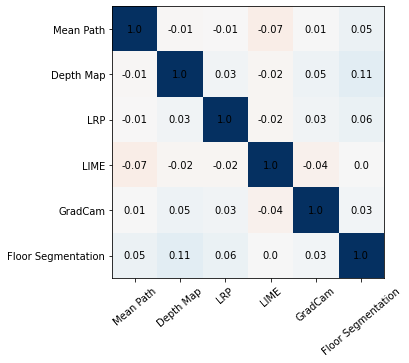

In [50]:
all_5_rdms = plot_representational_geometries_with_corr_VISACT(5, subset = "all")
np.save("C:\\Users\\cbartni\\surfdrive\\PhD\\SceneRepresentationXAI\\saved_RDM_arrays_CRS21\\VISACT_all_5_rdms.npy", all_5_rdms)

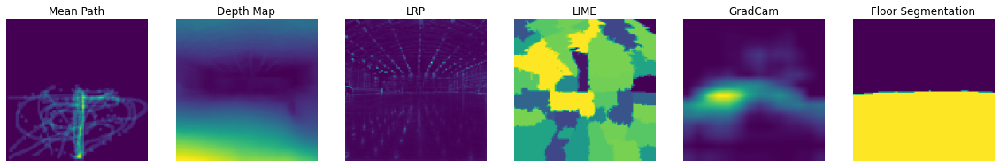

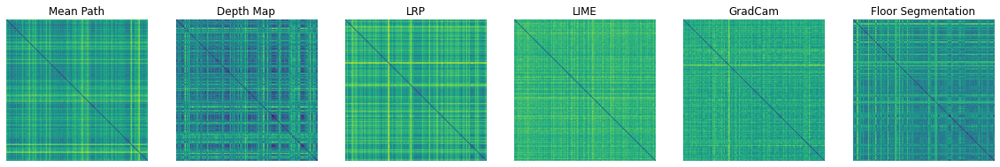

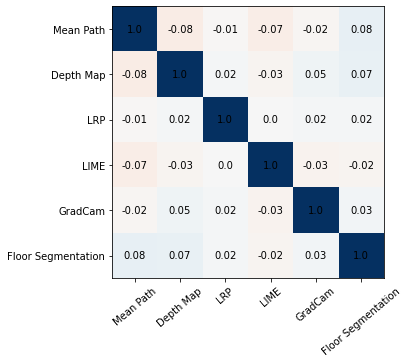

In [51]:
all_100_rdms = plot_representational_geometries_with_corr_VISACT(100, subset = "all")
np.save("C:\\Users\\cbartni\\surfdrive\\PhD\\SceneRepresentationXAI\\saved_RDM_arrays_CRS21\\VISACT_all_100_rdms.npy", all_100_rdms)

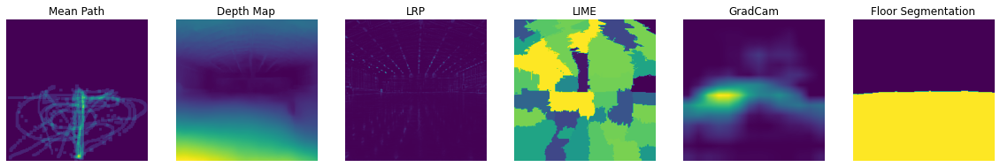

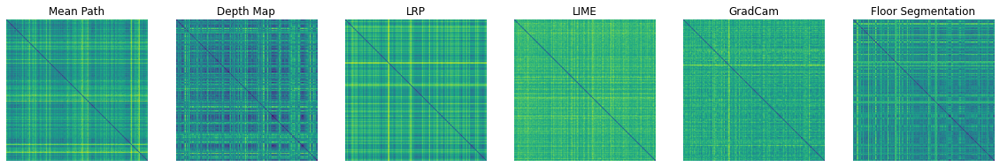

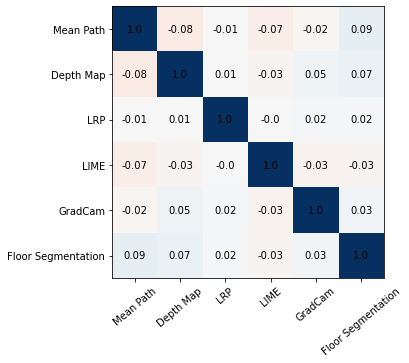

In [52]:
all_224_rdms = plot_representational_geometries_with_corr_VISACT(224, subset = "all")
np.save("C:\\Users\\cbartni\\surfdrive\\PhD\\SceneRepresentationXAI\\saved_RDM_arrays_CRS21\\VISACT_all_224_rdms.npy", all_224_rdms)

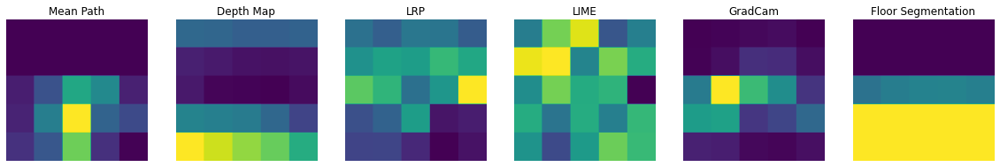

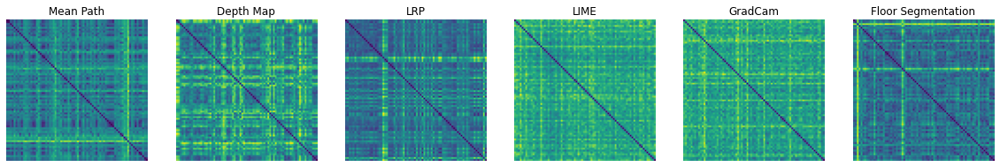

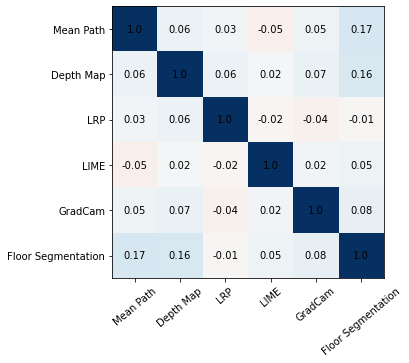

In [53]:
indoor_5_rdms = plot_representational_geometries_with_corr_VISACT(5, subset = "indoor")
np.save("C:\\Users\\cbartni\\surfdrive\\PhD\\SceneRepresentationXAI\\saved_RDM_arrays_CRS21\\VISACT_indoor_5_rdms.npy", indoor_5_rdms)

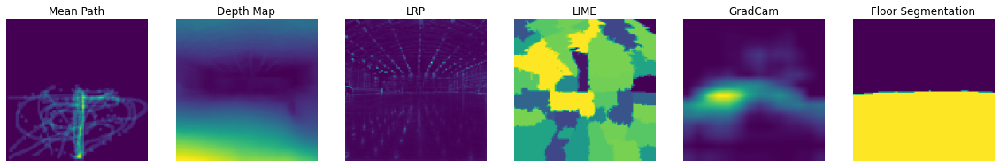

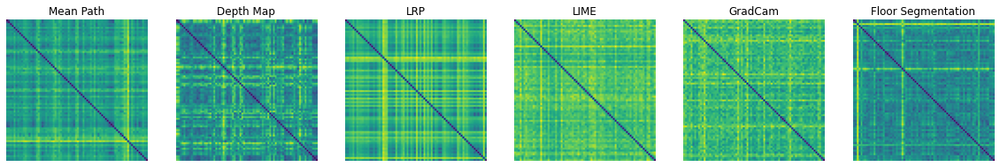

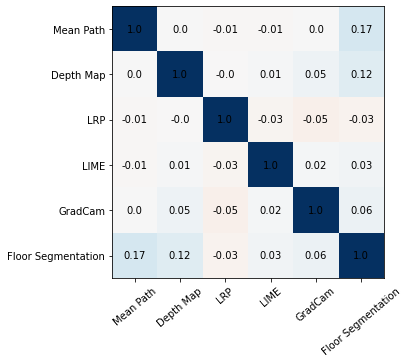

In [54]:
indoor_100_rdms = plot_representational_geometries_with_corr_VISACT(100, subset = "indoor")
np.save("C:\\Users\\cbartni\\surfdrive\\PhD\\SceneRepresentationXAI\\saved_RDM_arrays_CRS21\\VISACT_indoor_100_rdms.npy", indoor_100_rdms)

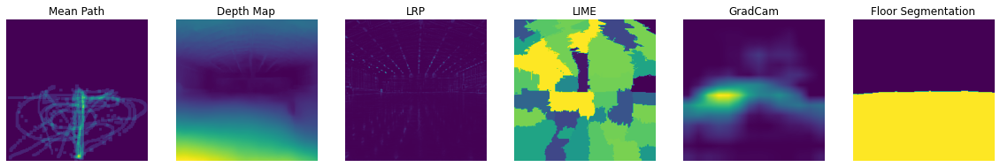

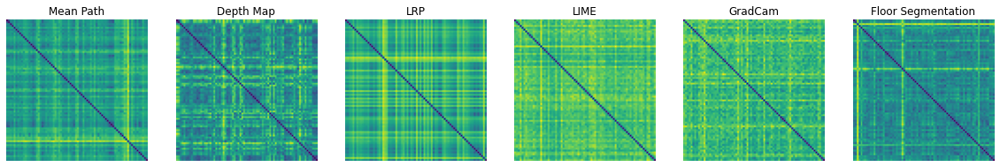

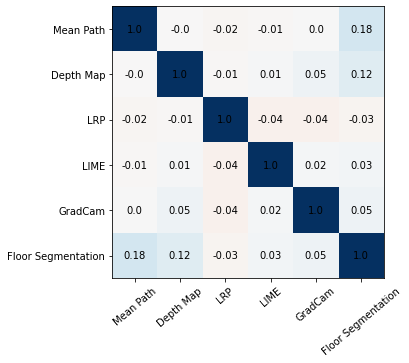

In [55]:
indoor_224_rdms = plot_representational_geometries_with_corr_VISACT(224, subset = "indoor")
np.save("C:\\Users\\cbartni\\surfdrive\\PhD\\SceneRepresentationXAI\\saved_RDM_arrays_CRS21\\VISACT_indoor_224_rdms.npy", indoor_224_rdms)

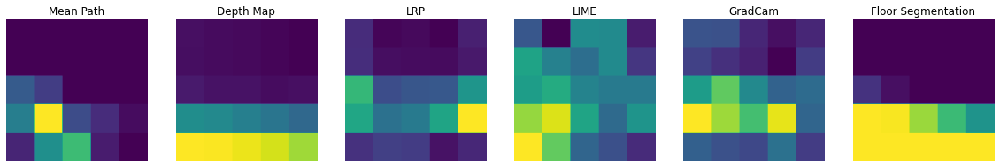

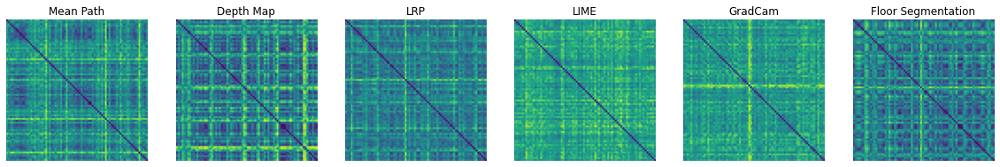

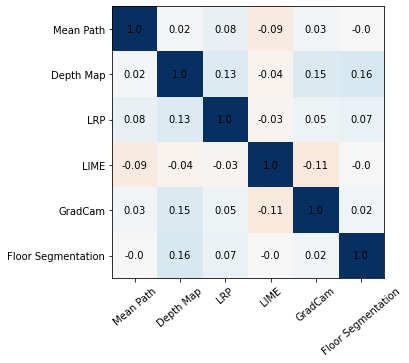

In [56]:
natural_5_rdms = plot_representational_geometries_with_corr_VISACT(5, subset = "natural")
np.save("C:\\Users\\cbartni\\surfdrive\\PhD\\SceneRepresentationXAI\\saved_RDM_arrays_CRS21\\VISACT_natural_5_rdms.npy", natural_5_rdms)

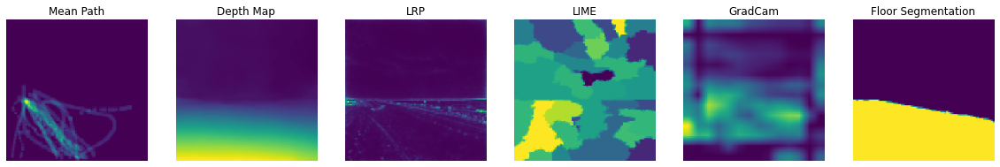

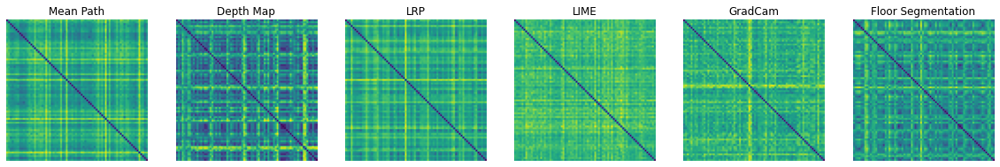

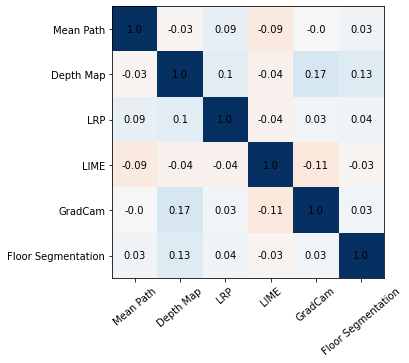

In [57]:
natural_100_rdms = plot_representational_geometries_with_corr_VISACT(100, subset = "natural")
np.save("C:\\Users\\cbartni\\surfdrive\\PhD\\SceneRepresentationXAI\\saved_RDM_arrays_CRS21\\VISACT_natural_100_rdms.npy", natural_100_rdms)

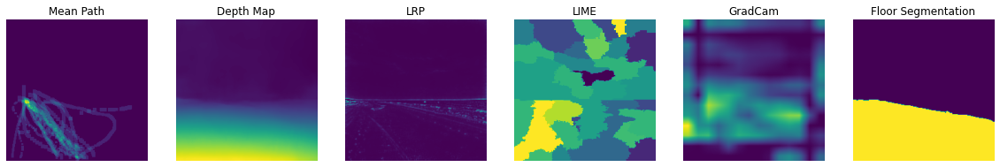

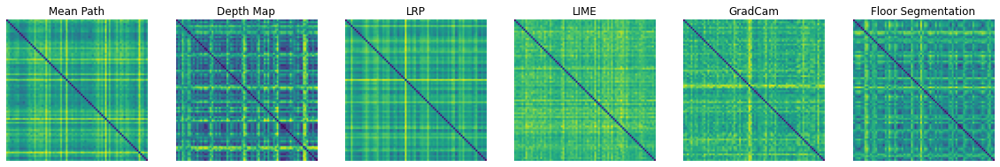

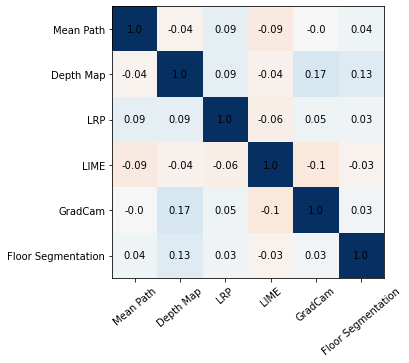

In [58]:
natural_224_rdms = plot_representational_geometries_with_corr_VISACT(224, subset = "natural")
np.save("C:\\Users\\cbartni\\surfdrive\\PhD\\SceneRepresentationXAI\\saved_RDM_arrays_CRS21\\VISACT_natural_224_rdms.npy", natural_224_rdms)

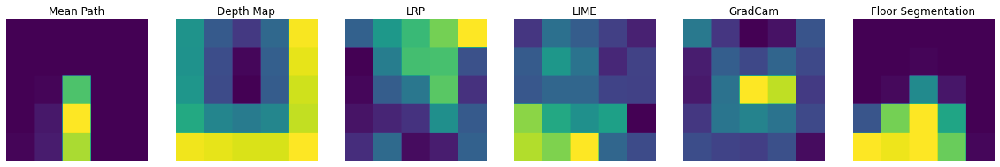

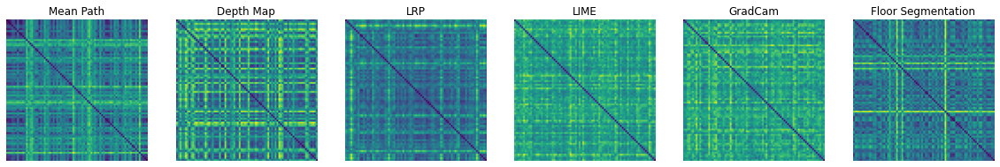

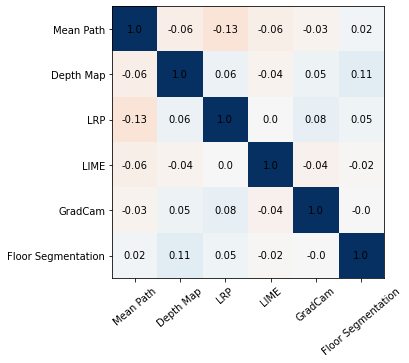

In [59]:
manmade_5_rdms = plot_representational_geometries_with_corr_VISACT(5, subset = "manmade")
np.save("C:\\Users\\cbartni\\surfdrive\\PhD\\SceneRepresentationXAI\\saved_RDM_arrays_CRS21\\VISACT_manmade_5_rdms.npy", manmade_5_rdms)

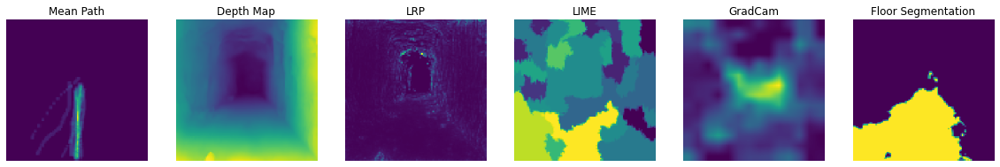

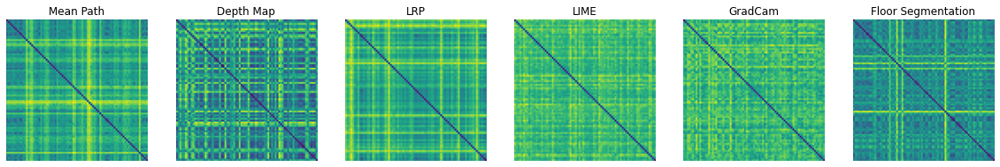

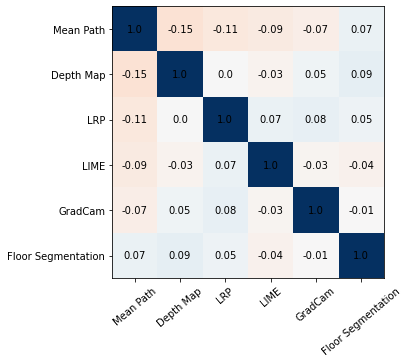

In [60]:
manmade_100_rdms = plot_representational_geometries_with_corr_VISACT(100, subset = "manmade")
np.save("C:\\Users\\cbartni\\surfdrive\\PhD\\SceneRepresentationXAI\\saved_RDM_arrays_CRS21\\VISACT_manmade_100_rdms.npy", manmade_100_rdms)

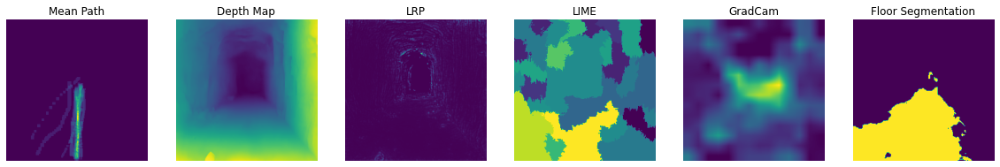

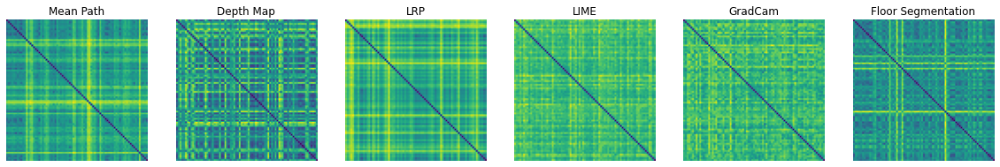

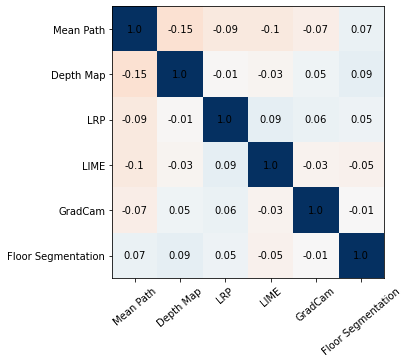

In [61]:
manmade_224_rdms = plot_representational_geometries_with_corr_VISACT(224, subset = "manmade")
np.save("C:\\Users\\cbartni\\surfdrive\\PhD\\SceneRepresentationXAI\\saved_RDM_arrays_CRS21\\VISACT_manmade_224_rdms.npy", manmade_224_rdms)

In [68]:
save_path = "C:\\Users\\cbartni\\surfdrive\\PhD\\SceneRepresentationXAI\\Images_CRS21_with_slices\\"
save_all_image_reps(19, 224, save_path)

In [98]:
save_path = "C:\\Users\\cbartni\\surfdrive\\PhD\\SceneRepresentationXAI\\Images_CRS21_with_slices\\"
save_all_image_reps(19, 6, save_path)

In [99]:
save_path = "C:\\Users\\cbartni\\surfdrive\\PhD\\SceneRepresentationXAI\\Images_CRS21_with_slices\\"
save_all_image_reps(19, 56, save_path)

In [71]:
save_path = "C:\\Users\\cbartni\\surfdrive\\PhD\\SceneRepresentationXAI\\Images_CRS21_with_slices\\"
save_all_image_reps_bonner(24, 224, save_path)

In [67]:
# safe all RDMs as single images

rdms_dir = "C:\\Users\\cbartni\\surfdrive\\PhD\\SceneRepresentationXAI\\saved_RDM_arrays_CRS21\\"
save_path = "C:\\Users\\cbartni\\surfdrive\\PhD\\SceneRepresentationXAI\\saved_RDM_arrays_CRS21\\"
names = ["Mean Path", "Depth Map", "LRP", "LIME", "Grad Cam", "Floor Segmentation"]
for file in os.listdir(rdms_dir):
    if "224" in file:
        rdms_dummy = np.load(rdms_dir + file)
        
        for count, i in enumerate(rdms_dummy):
            fig,ax = plt.subplots(1,1, figsize=(10, 10))
   
            #ax.set_title(names[i])
            ax.imshow(i)
            ax.axis("off")

            plt.savefig(save_path + file[:-4] + names[count] + '.png', bbox_inches='tight', dpi = 300)
            plt.close()
            

In [97]:
# safe all RDMs as single images

rdms_dir = "C:\\Users\\cbartni\\surfdrive\\PhD\\SceneRepresentationXAI\\saved_RDM_arrays_CRS21\\"
save_path = "C:\\Users\\cbartni\\surfdrive\\PhD\\SceneRepresentationXAI\\saved_RDM_arrays_CRS21\\"
names = ["Mean Path", "Depth Map", "LRP", "LIME", "Grad Cam", "Floor Seg."]
for file in os.listdir(rdms_dir):
    print(file)
    if "224_rdms.npy" in file:
        rdms_dummy = np.load(rdms_dir + file)
        
        # compute the correlation between the representational geometries
        overview = np.zeros([len(rdms_dummy), len(rdms_dummy)])
        for count1, base in enumerate(rdms_dummy):
            for count2, second in enumerate(rdms_dummy):
                rdm_corr, pval = kendalltau(squareform(base.round(5)), squareform(second.round(5)))
                overview[count1, count2] = rdm_corr

        # Plot the correlation matrix between the representatinal geometries

        fig,ax = plt.subplots(1,1, figsize=(5, 5))
        ax.imshow(overview, vmin = -1, vmax = 1, cmap = "RdBu")

        for (j,i),label in np.ndenumerate(overview):
            ax.text(i,j,label.round(2),ha='center',va='center')

        ax.set_yticks(np.arange(len(names)))
        ax.set_xticks(np.arange(len(names)))
        ax.set_yticklabels(names)
        ax.set_xticklabels(names, rotation=40)
        plt.savefig(save_path + file[:-4] + '.svg', bbox_inches='tight')
        plt.close()
            

Bonner_100_rdms.npy
Bonner_20_rdms.npy
Bonner_224_rdms.npy
Bonner_224_rdms.svg
Bonner_224_rdmsDepth Map.png
Bonner_224_rdmsFloor Segmentation.png
Bonner_224_rdmsGrad Cam.png
Bonner_224_rdmsLIME.png
Bonner_224_rdmsLRP.png
Bonner_224_rdmsMean Path.png
Bonner_5_rdms.npy
VISACT_all_100_rdms.npy
VISACT_all_224_rdms.npy
VISACT_all_224_rdms.svg
VISACT_all_224_rdmsDepth Map.png
VISACT_all_224_rdmsFloor Segmentation.png
VISACT_all_224_rdmsGrad Cam.png
VISACT_all_224_rdmsLIME.png
VISACT_all_224_rdmsLRP.png
VISACT_all_224_rdmsMean Path.png
VISACT_all_5_rdms.npy
VISACT_indoor_100_rdms.npy
VISACT_indoor_224_rdms.npy
VISACT_indoor_224_rdms.svg
VISACT_indoor_224_rdmsDepth Map.png
VISACT_indoor_224_rdmsFloor Segmentation.png
VISACT_indoor_224_rdmsGrad Cam.png
VISACT_indoor_224_rdmsLIME.png
VISACT_indoor_224_rdmsLRP.png
VISACT_indoor_224_rdmsMean Path.png
VISACT_indoor_5_rdms.npy
VISACT_manmade_100_rdms.npy
VISACT_manmade_224_rdms.npy
VISACT_manmade_224_rdms.svg
VISACT_manmade_224_rdmsDepth Map.png
VIS

In [ ]:
fig,ax = plt.subplots(1,len(rdms), figsize=(20, 10))
    for i,rdm in enumerate(rdms):
        ax[i].set_title(names[i])
        ax[i].imshow(rdm)
        ax[i].axis("off")

    # compute the correlation between the representational geometries
    overview = np.zeros([len(rdvs), len(rdvs)])
    for count1, base in enumerate(rdvs):
        for count2, second in enumerate(rdvs):
            rdm_corr, pval = kendalltau(base, second)
            overview[count1, count2] = rdm_corr

    # Plot the correlation matrix between the representatinal geometries

    fig,ax = plt.subplots(1,1, figsize=(5, 5))
    ax.imshow(overview, vmin = -1, vmax = 1, cmap = "RdBu")

    for (j,i),label in np.ndenumerate(overview):
        ax.text(i,j,label.round(2),ha='center',va='center')

    ax.set_yticks(np.arange(len(names)))
    ax.set_xticks(np.arange(len(names)))
    ax.set_yticklabels(names)
    ax.set_xticklabels(names, rotation=40)
    plt.show(block = False)
    
    return rdms

In [138]:
def Resolution_experiment_VISACT(count, n_slices, method = "mean"):
    
    img_lrp = normalize_2D(lrp_array[count])
    img_lime = normalize_2D(LIME_array[count])
    img_mean_path = normalize_2D(mean_path_array[count])
    img_depth = normalize_2D(depthmap_arrays[count])
    img_Grad = normalize_2D(Grad_cam_arrays[count])
    img_seg = normalize_2D(floor_seg_arrays[count])
    
    split_lrp, lrp_means = split_image_into_tiles(img_lrp, n_slices, method = method)
    split_lime, lime_means = split_image_into_tiles(img_lime, n_slices, method = method)
    split_path, path_means = split_image_into_tiles(img_mean_path, n_slices, method = method)
    split_depth, depth_means = split_image_into_tiles(img_depth, n_slices, method = method)
    split_Grad, grad_means = split_image_into_tiles(img_Grad, n_slices, method = method)
    split_seg, seg_means = split_image_into_tiles(img_seg, n_slices, method = method)
    
    list_of_images = [split_path, split_depth, split_lrp, split_lime, split_Grad, split_seg]
    names = ["Mean Path", "Depth Map", "LRP", "LIME", "Grad Cam", "Floor Segmentation"]
    
    # compute correlation
    list_of_means = [path_means, depth_means, lrp_means, lime_means, grad_means, seg_means]

    overview = np.zeros([len(list_of_means), len(list_of_means)])
    for count1, base in enumerate(list_of_means):
        for count2, second in enumerate(list_of_means):
            rdm_corr, pval = kendalltau(base, second)
            overview[count1, count2] = rdm_corr
    return overview       

In [245]:
def Resolution_experiment_with_geometries_VISACT(n_slices, subset = "all"):
    
    if subset == "all":
        idx = np.arange(231)
    elif subset == "indoor":
        idx = indoor_idx
    elif subset == "natural":
        idx = natural_idx
    elif subset == "manmade":
        idx = manmade_idx
        
    # Select the number of slices
    length_of_means = n_slices * n_slices
    names = ["Mean Path", "Depth Map", "LRP", "LIME", "GradCam", "Floor Segmentation"]
    mean_array = np.zeros([len(idx), len(names), length_of_means])
    
    method = "mean"
    for number, count in enumerate(idx):
        #print("Processing Image: " , count)

        img_lrp = normalize_2D(lrp_array[count])
        img_lime = normalize_2D(LIME_array[count])
        img_mean_path = normalize_2D(mean_path_array[count])
        img_depth = normalize_2D(depthmap_arrays[count])
        img_Grad = normalize_2D(Grad_cam_arrays[count])
        img_seg = normalize_2D(floor_seg_arrays[count])

        split_lrp, lrp_means = split_image_into_tiles(img_lrp, n_slices, method = method)
        split_lime, lime_means = split_image_into_tiles(img_lime, n_slices, method = method)
        split_path, path_means = split_image_into_tiles(img_mean_path, n_slices, method = method)
        split_depth, depth_means = split_image_into_tiles(img_depth, n_slices, method = method)
        split_Grad, grad_means = split_image_into_tiles(img_Grad, n_slices, method = method)
        split_seg, seg_means = split_image_into_tiles(img_seg, n_slices, method = method)

        list_of_means = [path_means, depth_means, lrp_means, lime_means, grad_means, seg_means]
        for count2, i in enumerate(list_of_means):
            mean_array[number][count2] = i

    
    # Compute the RDMs and the RDVs

    rdms = np.zeros([len(names),len(idx),len(idx)])
    num_flatten = int(len(idx) * (len(idx) - 1) / 2)
    rdvs = np.zeros([len(names), num_flatten])
    for i in range(len(names)):
        rdms[i] = pairwise_distances(mean_array[:,i] , metric= 'euclidean')
        rdvs[i] = squareform(rdms[i].round(5))

    # compute the correlation between the representational geometries
    overview = np.zeros([len(rdvs), len(rdvs)])
    for count1, base in enumerate(rdvs):
        for count2, second in enumerate(rdvs):
            rdm_corr, pval = kendalltau(base, second)
            overview[count1, count2] = rdm_corr
            
    return overview

In [263]:
def Resolution_experiment_geometries__bonner(n_slices):
    '''
    This function splits the images into the specified number of slices and computes the pair-wise similiarity 
    between all other images and thereby creates a representational space for each input modality/representation.   
    
    input: n_slices - int: number of slices in which the image should be split along each axis
    
    output: plots the representations side by side and a overview showing the correlations (kendall's tau) between them.
    
    '''
    # Select the number of slices
    length_of_means = n_slices * n_slices

    mean_array = np.zeros([50, 6, length_of_means])
    method = "mean"
    for count in range(50):
        #print("Processing Image: " , count)

        img_lrp = normalize_2D(Bonner_lrp_array[count])
        img_lime = normalize_2D(Bonner_LIME_array[count])
        img_mean_path = normalize_2D(bonnerTrajs[count])
        img_depth = normalize_2D(Bonner_depthmap_arrays[count])
        img_Grad = normalize_2D(Bonner_grad_cam_arrays[count])
        img_seg = normalize_2D(floor_seg_array[count])

        split_lrp, lrp_means = split_image_into_tiles(img_lrp, n_slices, method = method)
        split_lime, lime_means = split_image_into_tiles(img_lime, n_slices, method = method)
        split_path, path_means = split_image_into_tiles(img_mean_path, n_slices, method = method)
        split_depth, depth_means = split_image_into_tiles(img_depth, n_slices, method = method)
        split_Grad, grad_means = split_image_into_tiles(img_Grad, n_slices, method = method)
        split_seg, seg_means = split_image_into_tiles(img_seg, n_slices, method = method)

        length_of_means = n_slices * n_slices

        list_of_means = [path_means, depth_means, lrp_means, lime_means, grad_means, seg_means]
        for count2, i in enumerate(list_of_means):
            mean_array[count][count2] = i

    list_of_images = [split_path, split_depth, split_lrp, split_lime, split_Grad, split_seg]
    names = ["Mean Path", "Depth Map", "LRP", "LIME", "GradCam", "Floor Segmentation"]
    
    # Compute the RDMs and the RDVs

    rdms = np.zeros([6,50,50])
    rdvs = np.zeros([6, 1225])
    for i in range(6):
        rdms[i] = pairwise_distances(mean_array[:,i] , metric= 'euclidean')
        rdvs[i] = squareform(rdms[i].round(5))


    
    # compute the correlation between the representational geometries
    overview = np.zeros([len(rdvs), len(rdvs)])
    for count1, base in enumerate(rdvs):
        for count2, second in enumerate(rdvs):
            rdm_corr, pval = kendalltau(base, second)
            overview[count1, count2] = rdm_corr

    return overview

In [140]:
def Resolution_experiment_Bonner(count, n_slices, method = "mean"):
    
    img_lrp = normalize_2D(Bonner_lrp_array[count])
    img_lime = normalize_2D(Bonner_LIME_array[count])
    img_mean_path = normalize_2D(bonnerTrajs[count])
    img_depth = normalize_2D(Bonner_depthmap_arrays[count])
    img_Grad = normalize_2D(Bonner_grad_cam_arrays[count])
    img_seg = normalize_2D(floor_seg_array[count])
    
    split_lrp, lrp_means = split_image_into_tiles(img_lrp, n_slices, method = method)
    split_lime, lime_means = split_image_into_tiles(img_lime, n_slices, method = method)
    split_path, path_means = split_image_into_tiles(img_mean_path, n_slices, method = method)
    split_depth, depth_means = split_image_into_tiles(img_depth, n_slices, method = method)
    split_Grad, grad_means = split_image_into_tiles(img_Grad, n_slices, method = method)
    split_seg, seg_means = split_image_into_tiles(img_seg, n_slices, method = method)
    
    list_of_images = [split_path, split_depth, split_lrp, split_lime, split_Grad, split_seg]
    names = ["Mean Path", "Depth Map", "LRP", "LIME", "Grad Cam", "Floor Segmentation"]
    
    # compute correlation
    list_of_means = [path_means, depth_means, lrp_means, lime_means, grad_means, seg_means]

    overview = np.zeros([len(list_of_means), len(list_of_means)])
    for count1, base in enumerate(list_of_means):
        for count2, second in enumerate(list_of_means):
            rdm_corr, pval = kendalltau(base, second)
            overview[count1, count2] = rdm_corr
    return overview       

Run the resolution Experiment VISACT

In [321]:
complete_overview = np.zeros([22, 6, 6])


for count2, slices in enumerate([2,4,8,12,16,20,24,30,40,50,60,70,80,90,100,110,120,130,160,190,220, 224]):
    print(slices)
    complete_overview[count2] = Resolution_experiment_with_geometries_VISACT(slices, subset = "manmade")
    np.save("C:\\Users\\cbartni\\surfdrive\\PhD\\SceneRepresentationXAI\\Overview_arrays\\VISACT_geometries_comp_manmade", complete_overview)

2
4
8
12
16
20
24
30
40
50
60
70
80
90
100
110
120
130
160
190
220
224


In [309]:
complete_overview = np.zeros([22, 6, 6])


for count2, slices in enumerate([2,4,8,12,16,20,24,30,40,50,60,70,80,90,100,110,120,130,160,190,220, 224]):
    print(slices)
    complete_overview[count2] = Resolution_experiment_geometries__bonner(slices)
    np.save("C:\\Users\\cbartni\\surfdrive\\PhD\\SceneRepresentationXAI\\Overview_arrays\\Bonner_geometries_split", complete_overview)

2
4
8
12
16
20
24
30
40
50
60
70
80
90
100
110
120
130
160
190
220
224


In [374]:
# takes quite some time to compute so precomputed

# 50 images of the Bonner stimuli set 
#only indoor images
Bonner_overview = np.load("C:\\Users\\cbartni\\surfdrive\\PhD\\SceneRepresentationXAI\\Overview_arrays\\Bonner_geometries_split.npy")


#all 231 images
VISACT_complete_overview = np.load("C:\\Users\\cbartni\\surfdrive\\PhD\\SceneRepresentationXAI\\Overview_arrays\\VISACT_geometries_comp.npy")

#only indoor images
VISACT_indoor_overview = np.load("C:\\Users\\cbartni\\surfdrive\\PhD\\SceneRepresentationXAI\\Overview_arrays\\VISACT_geometries_comp_indoor.npy")

#only outdoor natural images
VISACT_natural_overview = np.load("C:\\Users\\cbartni\\surfdrive\\PhD\\SceneRepresentationXAI\\Overview_arrays\\VISACT_geometries_comp_natural.npy")
                                
#only outdoor manmade images
VISACT_manmade_overview = np.load("C:\\Users\\cbartni\\surfdrive\\PhD\\SceneRepresentationXAI\\Overview_arrays\\VISACT_geometries_comp_manmade.npy")

Load in and plot the Bonner correlations

In [330]:
# path - with all others (1 row of corr matrix)
path_depth = Bonner_overview[:, 0, 1]
path_LRP = Bonner_overview[:, 0, 2]
path_LIME = Bonner_overview[:, 0, 3]
path_Grad = Bonner_overview[:, 0, 4]
path_fseg = Bonner_overview[:, 0, 5]

# depth - with all others (2 row of corr matrix)
depth_LRP = Bonner_overview[:, 1, 2]
depth_LIME = Bonner_overview[:, 1, 3]
depth_Grad = Bonner_overview[:, 1, 4]
depth_fseg = Bonner_overview[:, 1, 5]

# LRP - with all others (3 row of corr matrix)
LRP_LIME = Bonner_overview[:, 2, 3]
LRP_Grad = Bonner_overview[:, 2, 4]
LRP_fseg = Bonner_overview[:, 2, 5]

# LIME - with all others (4 row of corr matrix)
LIME_Grad = Bonner_overview[:, 3, 4]
LIME_fseg = Bonner_overview[:, 3, 5]

# Grad- with floor seg (5 row of corr matrix)
Grad_fseg = Bonner_overview[:, 3, 5]


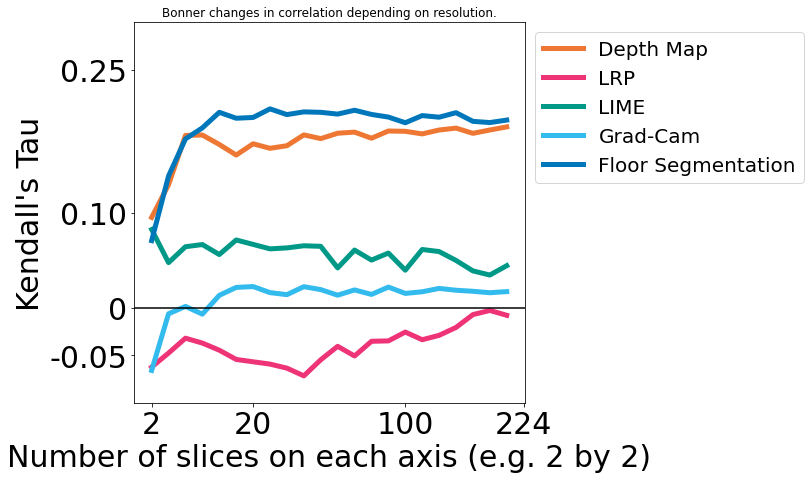

In [447]:
x_ticks = [0, 6, 15, 22]
x = ["2" ,"20", "100", "224"]
y_ticks = [-0.05, 0, 0.10, 0.25]
y = ["-0.05", "0", "0.10", "0.25"]
fig,ax = plt.subplots(1,1, figsize=(7, 7))

# mean path with depth map
ax.plot(path_depth, color = "#EE7733" ,label = "Depth Map", linewidth=5)
ax.plot(path_LRP, color = "#EE3377" ,label = "LRP", linewidth=5)
ax.plot(path_LIME, color = "#009988" ,label = "LIME", linewidth=5)
ax.plot(path_Grad, color = "#33BBEE" ,label = "Grad-Cam", linewidth=5)
ax.plot(path_fseg, color = "#0077BB" ,label = "Floor Segmentation", linewidth=5)

ax.axhline(0, color = "black")
ax.set_ylim(-0.1,0.30)

plt.xticks(x_ticks, x, fontsize =30, rotation = 0)
plt.yticks(y_ticks, y, fontsize =30, rotation = 0)
#ax.axis("off")
plt.legend(fontsize = 20, ncol=1, bbox_to_anchor=(1, 0.5 , 0.5, 0.5))
plt.ylabel("Kendall's Tau", fontsize = 30)
plt.title("Bonner changes in correlation depending on resolution.")
plt.xlabel("Number of slices on each axis (e.g. 2 by 2)", fontsize = 30)
plt.savefig("C:\\Users\\cbartni\\surfdrive\\PhD\\SceneRepresentationXAI\\poster_images\\Bonner_overview.svg", bbox_inches='tight', dpi = 300)
plt.show()

Plot VISACT correlations across slices for all images

In [369]:
# path - with all others (1 row of corr matrix)
path_depth_VISACT_all = VISACT_complete_overview[:, 0, 1]
path_LRP_VISACT_all = VISACT_complete_overview[:, 0, 2]
path_LIME_VISACT_all = VISACT_complete_overview[:, 0, 3]
path_Grad_VISACT_all = VISACT_complete_overview[:, 0, 4]
path_fseg_VISACT_all = VISACT_complete_overview[:, 0, 5]

# depth - with all others (2 row of corr matrix)
depth_LRP_VISACT_all = VISACT_complete_overview[:, 1, 2]
depth_LIME_VISACT_all = VISACT_complete_overview[:, 1, 3]
depth_Grad_VISACT_all = VISACT_complete_overview[:, 1, 4]
depth_fseg_VISACT_all = VISACT_complete_overview[:, 1, 5]

# LRP - with all others (3 row of corr matrix)
LRP_LIME_VISACT_all = VISACT_complete_overview[:, 2, 3]
LRP_Grad_VISACT_all = VISACT_complete_overview[:, 2, 4]
LRP_fseg_VISACT_all = VISACT_complete_overview[:, 2, 5]

# LIME - with all others (4 row of corr matrix)
LIME_Grad_VISACT_all = VISACT_complete_overview[:, 3, 4]
LIME_fseg_VISACT_all = VISACT_complete_overview[:, 3, 5]

# Grad- with floor seg (5 row of corr matrix)
Grad_fseg_VISACT_all = VISACT_complete_overview[:, 3, 5]

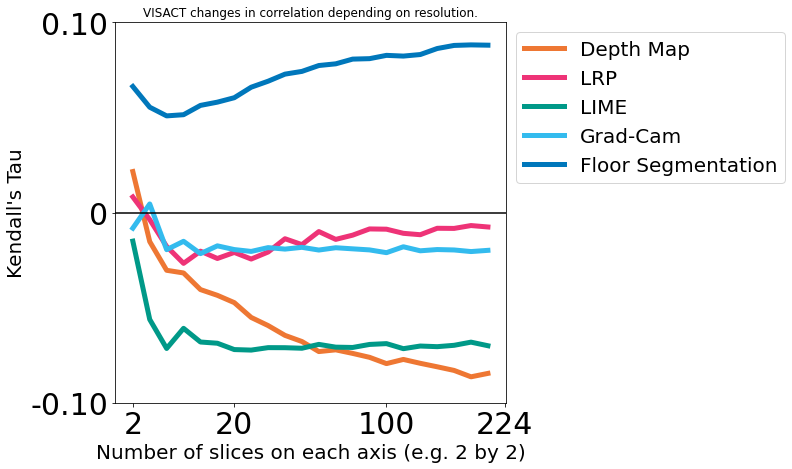

In [448]:
#x_ticks = np.arange(0,22,1)
#x = ["2","4","8","12","16","20","24","30","40","50","60","70","80","90","100","110","120","130","160","190","220", "224"]
fig,ax = plt.subplots(1,1, figsize=(7, 7))
x_ticks = [0, 6, 15, 22]
x = ["2" ,"20", "100", "224"]
y_ticks = [-0.10, 0, 0.10]
y = ["-0.10", "0", "0.10"]


# mean path with depth map
ax.plot(path_depth_VISACT_all, color = "#EE7733" ,label = "Depth Map", linewidth=5)
ax.plot(path_LRP_VISACT_all, color = "#EE3377" ,label = "LRP", linewidth=5)
ax.plot(path_LIME_VISACT_all, color = "#009988" ,label = "LIME", linewidth=5)
ax.plot(path_Grad_VISACT_all, color = "#33BBEE" ,label = "Grad-Cam", linewidth=5)
ax.plot(path_fseg_VISACT_all, color = "#0077BB" ,label = "Floor Segmentation", linewidth=5)

ax.axhline(0, color = "black")
ax.set_ylim(-0.1,0.1)

plt.xticks(x_ticks, x, fontsize =30, rotation = 0)
plt.yticks(y_ticks, y, fontsize =30, rotation = 0)
#ax.axis("off")
plt.legend(fontsize = 20, ncol=1, bbox_to_anchor=(1, 0.5 , 0.5, 0.5))

plt.ylabel("Kendall's Tau", fontsize = 20)
plt.title("VISACT changes in correlation depending on resolution.")
plt.xlabel("Number of slices on each axis (e.g. 2 by 2)", fontsize = 20)
plt.savefig("C:\\Users\\cbartni\\surfdrive\\PhD\\SceneRepresentationXAI\\poster_images\\VISACT_all_overview.svg", bbox_inches='tight', dpi = 300)
plt.show()

VISACT only indoor

In [375]:
# path - with all others (1 row of corr matrix)
path_depth_VISACT_indoor = VISACT_indoor_overview[:, 0, 1]
path_LRP_VISACT_indoor = VISACT_indoor_overview[:, 0, 2]
path_LIME_VISACT_indoor = VISACT_indoor_overview[:, 0, 3]
path_Grad_VISACT_indoor = VISACT_indoor_overview[:, 0, 4]
path_fseg_VISACT_indoor = VISACT_indoor_overview[:, 0, 5]

# depth - with all others (2 row of corr matrix)
depth_LRP_VISACT_indoor = VISACT_indoor_overview[:, 1, 2]
depth_LIME_VISACT_indoor = VISACT_indoor_overview[:, 1, 3]
depth_Grad_VISACT_indoor = VISACT_indoor_overview[:, 1, 4]
depth_fseg_VISACT_indoor = VISACT_indoor_overview[:, 1, 5]

# LRP - with all others (3 row of corr matrix)
LRP_LIME_VISACT_indoor = VISACT_indoor_overview[:, 2, 3]
LRP_Grad_VISACT_indoor = VISACT_indoor_overview[:, 2, 4]
LRP_fseg_VISACT_indoor = VISACT_indoor_overview[:, 2, 5]

# LIME - with all others (4 row of corr matrix)
LIME_Grad_VISACT_indoor = VISACT_indoor_overview[:, 3, 4]
LIME_fseg_VISACT_indoor = VISACT_indoor_overview[:, 3, 5]

# Grad- with floor seg (5 row of corr matrix)
Grad_fseg_VISACT_indoor = VISACT_indoor_overview[:, 3, 5]

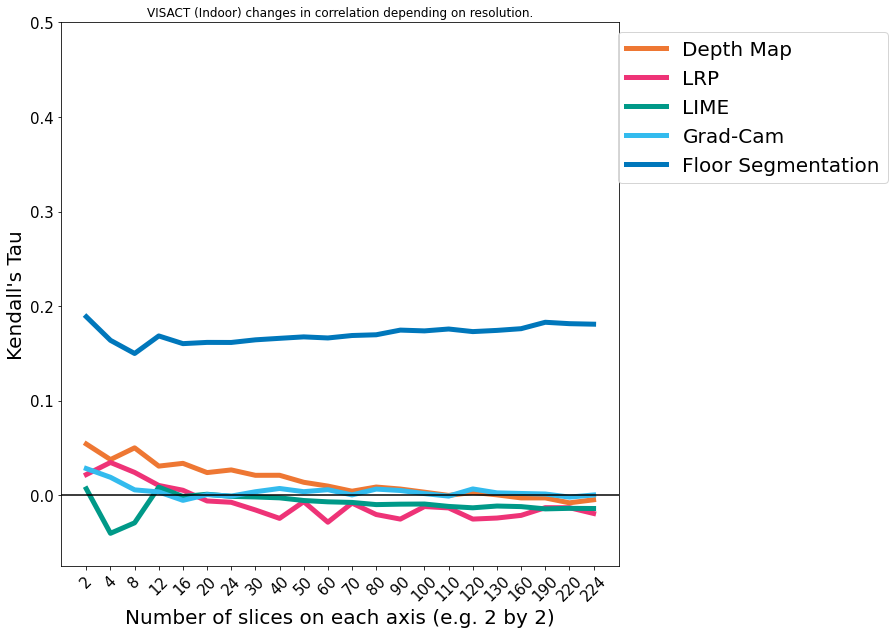

In [449]:
x_ticks = np.arange(0,22,1)
x = ["2","4","8","12","16","20","24","30","40","50","60","70","80","90","100","110","120","130","160","190","220", "224"]
fig,ax = plt.subplots(1,1, figsize=(10, 10))

# mean path with depth map
ax.plot(path_depth_VISACT_indoor, color = "#EE7733" ,label = "Depth Map", linewidth=5)
ax.plot(path_LRP_VISACT_indoor, color = "#EE3377" ,label = "LRP", linewidth=5)
ax.plot(path_LIME_VISACT_indoor, color = "#009988" ,label = "LIME", linewidth=5)
ax.plot(path_Grad_VISACT_indoor, color = "#33BBEE" ,label = "Grad-Cam", linewidth=5)
ax.plot(path_fseg_VISACT_indoor, color = "#0077BB" ,label = "Floor Segmentation", linewidth=5)

ax.axhline(0, color = "black")
ax.set_ylim(-0.075,0.5)

plt.xticks(x_ticks, x, fontsize =15, rotation = 45)
#ax.axis("off")
plt.legend(fontsize = 20, ncol=1, bbox_to_anchor=(1, 0.5 , 0.5, 0.5))
plt.yticks(fontsize = 15)
plt.ylabel("Kendall's Tau", fontsize = 20)
plt.title("VISACT (Indoor) changes in correlation depending on resolution.")
plt.xlabel("Number of slices on each axis (e.g. 2 by 2)", fontsize = 20)
plt.savefig("C:\\Users\\cbartni\\surfdrive\\PhD\\SceneRepresentationXAI\\poster_images\\VISACT_indoor_overview.svg", bbox_inches='tight', dpi = 300)
plt.show()

In [379]:
# path - with all others (1 row of corr matrix)
path_depth_VISACT_natural = VISACT_natural_overview[:, 0, 1]
path_LRP_VISACT_natural = VISACT_natural_overview[:, 0, 2]
path_LIME_VISACT_natural = VISACT_natural_overview[:, 0, 3]
path_Grad_VISACT_natural = VISACT_natural_overview[:, 0, 4]
path_fseg_VISACT_natural = VISACT_natural_overview[:, 0, 5]

# depth - with all others (2 row of corr matrix)
depth_LRP_VISACT_natural = VISACT_natural_overview[:, 1, 2]
depth_LIME_VISACT_natural = VISACT_natural_overview[:, 1, 3]
depth_Grad_VISACT_natural = VISACT_natural_overview[:, 1, 4]
depth_fseg_VISACT_natural = VISACT_natural_overview[:, 1, 5]

# LRP - with all others (3 row of corr matrix)
LRP_LIME_VISACT_natural = VISACT_natural_overview[:, 2, 3]
LRP_Grad_VISACT_natural = VISACT_natural_overview[:, 2, 4]
LRP_fseg_VISACT_natural = VISACT_natural_overview[:, 2, 5]

# LIME - with all others (4 row of corr matrix)
LIME_Grad_VISACT_natural = VISACT_natural_overview[:, 3, 4]
LIME_fseg_VISACT_natural = VISACT_natural_overview[:, 3, 5]

# Grad- with floor seg (5 row of corr matrix)
Grad_fseg_VISACT_natural = VISACT_natural_overview[:, 3, 5]

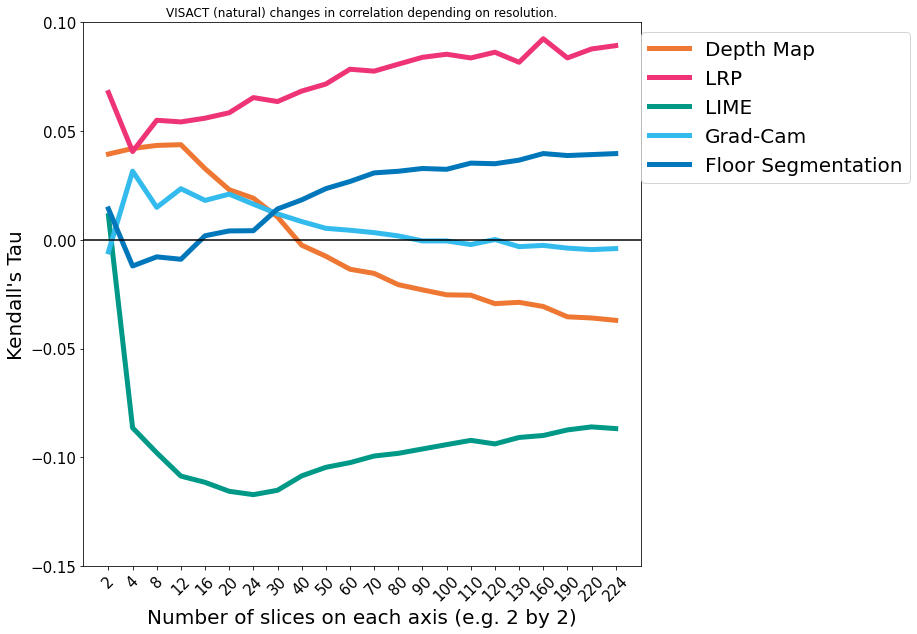

In [450]:
x_ticks = np.arange(0,22,1)
x = ["2","4","8","12","16","20","24","30","40","50","60","70","80","90","100","110","120","130","160","190","220", "224"]
fig,ax = plt.subplots(1,1, figsize=(10, 10))

# mean path with depth map
ax.plot(path_depth_VISACT_natural, color = "#EE7733" ,label = "Depth Map", linewidth=5)
ax.plot(path_LRP_VISACT_natural, color = "#EE3377" ,label = "LRP", linewidth=5)
ax.plot(path_LIME_VISACT_natural, color = "#009988" ,label = "LIME", linewidth=5)
ax.plot(path_Grad_VISACT_natural, color = "#33BBEE" ,label = "Grad-Cam", linewidth=5)
ax.plot(path_fseg_VISACT_natural, color = "#0077BB" ,label = "Floor Segmentation", linewidth=5)

ax.axhline(0, color = "black")
ax.set_ylim(-0.15,0.1)

plt.xticks(x_ticks, x, fontsize =15, rotation = 45)
#ax.axis("off")
plt.legend(fontsize = 20, ncol=1, bbox_to_anchor=(1, 0.5 , 0.5, 0.5))
plt.yticks(fontsize = 15)
plt.ylabel("Kendall's Tau", fontsize = 20)
plt.title("VISACT (natural) changes in correlation depending on resolution.")
plt.xlabel("Number of slices on each axis (e.g. 2 by 2)", fontsize = 20)
plt.savefig("C:\\Users\\cbartni\\surfdrive\\PhD\\SceneRepresentationXAI\\poster_images\\VISACT_natural_overview.svg", bbox_inches='tight', dpi = 300)
plt.show()

In [384]:
# path - with all others (1 row of corr matrix)
path_depth_VISACT_manmade = VISACT_manmade_overview[:, 0, 1]
path_LRP_VISACT_manmade = VISACT_manmade_overview[:, 0, 2]
path_LIME_VISACT_manmade = VISACT_manmade_overview[:, 0, 3]
path_Grad_VISACT_manmade = VISACT_manmade_overview[:, 0, 4]
path_fseg_VISACT_manmade = VISACT_manmade_overview[:, 0, 5]

# depth - with all others (2 row of corr matrix)
depth_LRP_VISACT_manmade = VISACT_manmade_overview[:, 1, 2]
depth_LIME_VISACT_manmade = VISACT_manmade_overview[:, 1, 3]
depth_Grad_VISACT_manmade = VISACT_manmade_overview[:, 1, 4]
depth_fseg_VISACT_manmade = VISACT_manmade_overview[:, 1, 5]

# LRP - with all others (3 row of corr matrix)
LRP_LIME_VISACT_manmade = VISACT_manmade_overview[:, 2, 3]
LRP_Grad_VISACT_manmade = VISACT_manmade_overview[:, 2, 4]
LRP_fseg_VISACT_manmade = VISACT_manmade_overview[:, 2, 5]

# LIME - with all others (4 row of corr matrix)
LIME_Grad_VISACT_manmade = VISACT_manmade_overview[:, 3, 4]
LIME_fseg_VISACT_manmade = VISACT_manmade_overview[:, 3, 5]

# Grad- with floor seg (5 row of corr matrix)
Grad_fseg_VISACT_manmade = VISACT_manmade_overview[:, 3, 5]

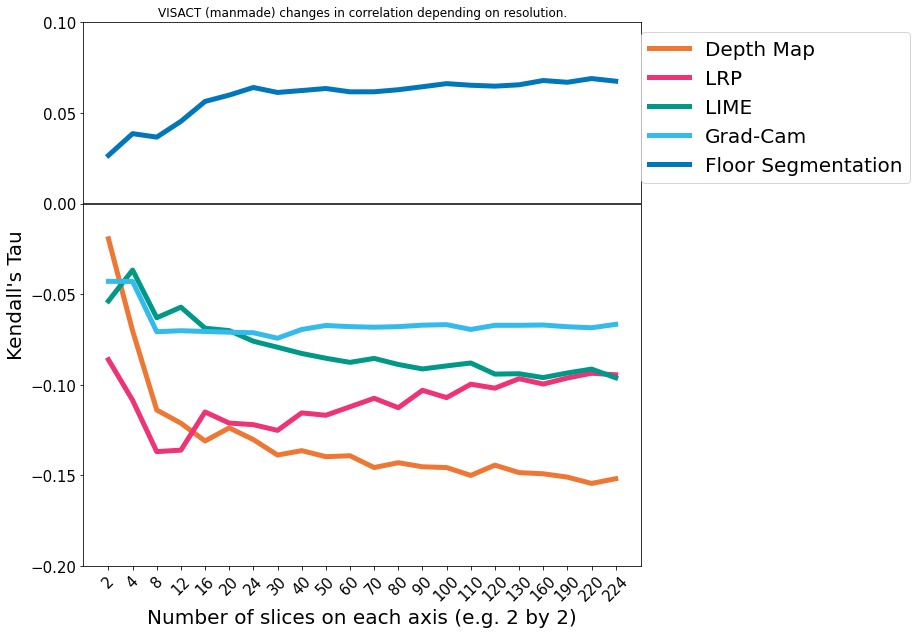

In [451]:
x_ticks = np.arange(0,22,1)
x = ["2","4","8","12","16","20","24","30","40","50","60","70","80","90","100","110","120","130","160","190","220", "224"]
fig,ax = plt.subplots(1,1, figsize=(10, 10))

# mean path with depth map
ax.plot(path_depth_VISACT_manmade, color = "#EE7733" ,label = "Depth Map", linewidth=5)
ax.plot(path_LRP_VISACT_manmade, color = "#EE3377" ,label = "LRP", linewidth=5)
ax.plot(path_LIME_VISACT_manmade, color = "#009988" ,label = "LIME", linewidth=5)
ax.plot(path_Grad_VISACT_manmade, color = "#33BBEE" ,label = "Grad-Cam", linewidth=5)
ax.plot(path_fseg_VISACT_manmade, color = "#0077BB" ,label = "Floor Segmentation", linewidth=5)

ax.axhline(0, color = "black")
ax.set_ylim(-0.2,0.1)

plt.xticks(x_ticks, x, fontsize =15, rotation = 45)
#ax.axis("off")
plt.legend(fontsize = 20, ncol=1, bbox_to_anchor=(1, 0.5 , 0.5, 0.5))
plt.yticks(fontsize = 15)
plt.ylabel("Kendall's Tau", fontsize = 20)
plt.title("VISACT (manmade) changes in correlation depending on resolution.")
plt.xlabel("Number of slices on each axis (e.g. 2 by 2)", fontsize = 20)
plt.savefig("C:\\Users\\cbartni\\surfdrive\\PhD\\SceneRepresentationXAI\\poster_images\\VISACT_manamde_overview.svg", bbox_inches='tight', dpi = 300)
plt.show()